# Capstone Project: Cellular Device Originated Melicious Attack Detection

**Overview**: In this application, your goal is to detect melicious traffic and identify the type of attack.



Understanding the Features


Data description:


```
Input variables:

1 - Seq (numeric) - argus sequence number.
2 - Dur (numeric) - record total duration. 
3 - RunTime (numeric) - total active flow run time. This value is generated through aggregation, and is the sum
of the records duration.
4 - Mean (numeric) - average duration of aggregated records.
5 - Sum (numeric) - total accumulated durations of aggregated records.
6 - Min (numeric) - minimum duration of aggregated records.
7 - Max (numeric) - maximum duration of aggregated records.
8 - Proto (Categorical) - transaction protocol.
9 - sTos (numeric) - source TOS byte value.
10 - dTos (numeric) - destination TOS byte value.
11 - sDSb (categorical) - source diff serve byte value.
12 - dDSb (categorical) - destination diff serve byte value.
13 - sTtl (numeric) - src -> dst TTL value.
14 - dTtl (numeric) - dst -> src TTL value.
15 - sHops (numeric) - estimate of number of IP hops from src to this point.
16 - dHops (numeric) - estimate of number of IP hops from dst to this point.
17 - Cause (categorical) - Argus record cause code. Valid values are Start, Status, Stop, Close, Error.
18 - TotPkts (numeric) - total transaction packet count.
19 - SrcPkts (numeric) - src -> dst packet count.
20 - DstPkts (numeric) - dst -> src packet count.
21 - TotBytes (numeric) - total transaction bytes.
22 - SrcBytes (numeric) - src -> dst transaction bytes.
23 - DstBytes (numeric) - dst -> src transaction bytes.
24 - Offset (numeric) - record byte offset in file or stream.
25 - sMeanPktSz (numeric) - Mean of the flow packet size transmitted by the src (initiator).
26 - dMeanPktSz (numeric) - Mean of the flow packet size transmitted by the dst (target).
27 - Load (numeric) - bits per second.
28 - SrcLoad (numeric) - source bits per second.
29 - DstLoad (numeric) - destination bits per second.
30 - Loss (numeric) - pkts retransmitted or dropped.
31 - SrcLoss (numeric) - source pkts retransmitted or dropped.
32 - DstLoss (numeric) - destination pkts retransmitted or dropped.
33 - pLoss (numeric) - percent pkts retransmitted or dropped.
34 - SrcGap (numeric) - source bytes missing in the data stream.
35 - DstGap (numeric) - destination bytes missing in the data stream.
36 - Rate (numeric) - pkts per second.
37 - SrcRate (numeric) - source pkts per second.
38 - DstRate (numeric) - destination pkts per second.
39 - State (categorical) - transaction state.
40 - SrcWin (numeric) - source TCP window advertisement.
42 - DstWin (numeric) - destination TCP window advertisement.
43 - sVid (numeric) - source VLAN identifier.
44 - dVid (numeric) - destination VLAN identifier.
45 - SrcTCPBase (numeric) - source TCP base sequence number.
46 - DstTCPBase (numeric) - destination TCP base sequence number.
47 - TcpRtt (numeric) - TCP connection setup round-trip time, the sum of ’synack’ and ’ackdat’.
48 - SynAck (numeric) - TCP connection setup time, the time between the SYN and the SYN_ACK packets.
49 - AckDat (numeric) - TCP connection setup time, the time between the SYN_ACK and the ACK packets.
50 - Attack Tool (categorical) - Type of source that launched the attack.

Targets:
51 - Label (categorical) - Metadata label.
52 - Attack Type (categorical) - Type of attack.

```



In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import os
import numpy as np
from functools import partial
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OneHotEncoder
from sklearn.metrics import classification_report
from sklearn.inspection import permutation_importance
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay
from sklearn.metrics import auc as skl_auc
from sklearn.metrics import precision_recall_fscore_support as score
from pandas.plotting import table

In [2]:
import textwrap
import warnings
warnings.simplefilter(action='ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
df_large = pd.read_csv('data/combined.csv')
df = df_large.sample(n=100000)

In [4]:

df.tail()

,Unnamed: 0,Seq,Dur,RunTime,Mean,Sum,Min,Max,Proto,sTos,dTos,sDSb,dDSb,sTtl,dTtl,sHops,dHops,Cause,TotPkts,SrcPkts,DstPkts,TotBytes,SrcBytes,DstBytes,Offset,sMeanPktSz,dMeanPktSz,Load,SrcLoad,DstLoad,Loss,SrcLoss,DstLoss,pLoss,SrcGap,DstGap,Rate,SrcRate,DstRate,State,SrcWin,DstWin,sVid,dVid,SrcTCPBase,DstTCPBase,TcpRtt,SynAck,AckDat,Label,Attack Type,Attack Tool
685442,685442,20627,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,udp,0.0,NaN,cs0,NaN,249.0,NaN,7.0,NaN,Start,1,1,0,74,74,0,4244564,74.0,0.0,0.000000,0.000000,0.0,0,0,0,0.0,NaN,NaN,0.000000,0.000000,0.0,INT,NaN,NaN,610.0,NaN,NaN,NaN,0.0,0.0,0.0,Benign,Benign,Benign
959802,231486,47905,2.572283,2.572283,2.572283,2.572283,2.572283,2.572283,udp,0.0,NaN,cs0,NaN,63.0,NaN,1.0,NaN,Status,2,2,0,84,84,0,15544252,42.0,0.0,130.623260,130.623260,0.0,0,0,0,0.0,NaN,NaN,0.388760,0.388760,0.0,REQ,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,Malicious,UDPFlood,Hping3
944416,216100,33040,2.571924,2.571924,2.571924,2.571924,2.571924,2.571924,udp,0.0,NaN,cs0,NaN,63.0,NaN,1.0,NaN,Status,2,2,0,84,84,0,14248292,42.0,0.0,130.641495,130.641495,0.0,0,0,0,0.0,NaN,NaN,0.388814,0.388814,0.0,REQ,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,Malicious,UDPFlood,Hping3
10383,10383,9806,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,tcp,0.0,NaN,cs0,NaN,48.0,NaN,16.0,NaN,Start,1,1,0,58,58,0,1015336,58.0,0.0,0.000000,0.000000,0.0,0,0,0,0.0,0.0,0.0,0.000000,0.000000,0.0,REQ,0.0,NaN,NaN,NaN,1.092102e+09,NaN,0.0,0.0,0.0,Malicious,SYNScan,Nmap
770905,42589,6258,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,udp,0.0,NaN,cs0,NaN,249.0,NaN,7.0,NaN,Start,1,1,0,74,74,0,1205848,74.0,0.0,0.000000,0.000000,0.0,0,0,0,0.0,NaN,NaN,0.000000,0.000000,0.0,INT,NaN,NaN,610.0,NaN,NaN,NaN,0.0,0.0,0.0,Benign,Benign,Benign


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100000 entries, 195423 to 770905
Data columns (total 52 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   100000 non-null  int64  
 1   Seq          100000 non-null  int64  
 2   Dur          100000 non-null  float64
 3   RunTime      100000 non-null  float64
 4   Mean         100000 non-null  float64
 5   Sum          100000 non-null  float64
 6   Min          100000 non-null  float64
 7   Max          100000 non-null  float64
 8   Proto        100000 non-null  object 
 9   sTos         99976 non-null   float64
 10  dTos         22347 non-null   float64
 11  sDSb         99976 non-null   object 
 12  dDSb         22347 non-null   object 
 13  sTtl         99976 non-null   float64
 14  dTtl         22347 non-null   float64
 15  sHops        99976 non-null   float64
 16  dHops        22347 non-null   float64
 17  Cause        100000 non-null  object 
 18  TotPkts      100000 non-

In [6]:
# Lets remove unnamed column
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

In [7]:
#Lets remove ragus Seq number since it is not generated by the device
df = df.loc[:, ~df.columns.str.contains('^Seq')]

In [8]:
#Lets remove ragus Seq number since it is not generated by the device
df = df.loc[:, ~df.columns.str.contains('^Cause')]

In [9]:
#Lets remove ragus Seq number since it is not generated by the device
df = df.loc[:, ~df.columns.str.contains('^Attack Tool')]

In [10]:
df.reset_index(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 49 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   index        100000 non-null  int64  
 1   Dur          100000 non-null  float64
 2   RunTime      100000 non-null  float64
 3   Mean         100000 non-null  float64
 4   Sum          100000 non-null  float64
 5   Min          100000 non-null  float64
 6   Max          100000 non-null  float64
 7   Proto        100000 non-null  object 
 8   sTos         99976 non-null   float64
 9   dTos         22347 non-null   float64
 10  sDSb         99976 non-null   object 
 11  dDSb         22347 non-null   object 
 12  sTtl         99976 non-null   float64
 13  dTtl         22347 non-null   float64
 14  sHops        99976 non-null   float64
 15  dHops        22347 non-null   float64
 16  TotPkts      100000 non-null  int64  
 17  SrcPkts      100000 non-null  int64  
 18  DstPkts      100000 non-n

In [11]:
print(df.describe());

              index            Dur        RunTime           Mean  \
count  1.000000e+05  100000.000000  100000.000000  100000.000000   
mean   6.079342e+05       1.363501       1.363501       1.363501   
std    3.519268e+05       1.688935       1.688935       1.688935   
min    0.000000e+00       0.000000       0.000000       0.000000   
25%    3.024070e+05       0.000000       0.000000       0.000000   
50%    6.075380e+05       0.000000       0.000000       0.000000   
75%    9.135062e+05       2.580313       2.580313       2.580313   
max    1.215888e+06      19.630236      19.630236      19.630236   

                 Sum            Min            Max          sTos  \
count  100000.000000  100000.000000  100000.000000  99976.000000   
mean        1.363501       1.363501       1.363501      0.827689   
std         1.688935       1.688935       1.688935     12.211587   
min         0.000000       0.000000       0.000000      0.000000   
25%         0.000000       0.000000       0.000

### Exploratory data analysis

In [12]:
df.head()

,index,Dur,RunTime,Mean,Sum,Min,Max,Proto,sTos,dTos,sDSb,dDSb,sTtl,dTtl,sHops,dHops,TotPkts,SrcPkts,DstPkts,TotBytes,SrcBytes,DstBytes,Offset,sMeanPktSz,dMeanPktSz,Load,SrcLoad,DstLoad,Loss,SrcLoss,DstLoss,pLoss,SrcGap,DstGap,Rate,SrcRate,DstRate,State,SrcWin,DstWin,sVid,dVid,SrcTCPBase,DstTCPBase,TcpRtt,SynAck,AckDat,Label,Attack Type
0,195423,4.564231,4.564231,4.564231,4.564231,4.564231,4.564231,udp,0.0,NaN,cs0,NaN,63.0,NaN,1.0,NaN,3,3,0,126,126,0,12409860,42.00000,0.000000,147.231812,147.231812,0.00000,0,0,0,0.0,NaN,NaN,0.438190,0.438190,0.000000,REQ,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,Malicious,UDPFlood
1,917763,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,udp,0.0,NaN,cs0,NaN,63.0,NaN,1.0,NaN,1,1,0,42,42,0,12002540,42.00000,0.000000,0.000000,0.000000,0.00000,0,0,0,0.0,NaN,NaN,0.000000,0.000000,0.000000,REQ,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,Malicious,UDPFlood
2,287596,2.584038,2.584038,2.584038,2.584038,2.584038,2.584038,udp,0.0,NaN,cs0,NaN,63.0,NaN,1.0,NaN,2,2,0,84,84,0,20161452,42.00000,0.000000,130.029053,130.029053,0.00000,0,0,0,0.0,NaN,NaN,0.386991,0.386991,0.000000,REQ,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,Benign,Benign
3,816789,2.586121,2.586121,2.586121,2.586121,2.586121,2.586121,udp,0.0,NaN,cs0,NaN,63.0,NaN,1.0,NaN,2,2,0,84,84,0,3481588,42.00000,0.000000,129.924316,129.924316,0.00000,0,0,0,0.0,NaN,NaN,0.386680,0.386680,0.000000,INT,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,Malicious,UDPFlood
4,1181885,4.987077,4.987077,4.987077,4.987077,4.987077,4.987077,tcp,0.0,0.0,cs0,cs0,64.0,117.0,0.0,11.0,43,22,21,29385,3823,25562,2044388,173.77272,1217.238037,44908.066410,5855.132812,39052.93359,0,0,0,0.0,0.0,0.0,8.421766,4.210883,4.010365,CON,828928.0,104704.0,NaN,NaN,1.358353e+09,960126204.0,0.034837,0.020551,0.014286,Benign,Benign


In [13]:
# Check for missing values in percent

df.isna().mean().mul(100).round(2)

index           0.00
Dur             0.00
RunTime         0.00
Mean            0.00
Sum             0.00
Min             0.00
Max             0.00
Proto           0.00
sTos            0.02
dTos           77.65
sDSb            0.02
dDSb           77.65
sTtl            0.02
dTtl           77.65
sHops           0.02
dHops          77.65
TotPkts         0.00
SrcPkts         0.00
DstPkts         0.00
TotBytes        0.00
SrcBytes        0.00
DstBytes        0.00
Offset          0.00
sMeanPktSz      0.00
dMeanPktSz      0.00
Load            0.00
SrcLoad         0.00
DstLoad         0.00
Loss            0.00
SrcLoss         0.00
DstLoss         0.00
pLoss           0.00
SrcGap         77.18
DstGap         77.18
Rate            0.00
SrcRate         0.00
DstRate         0.00
State           0.00
SrcWin         80.18
DstWin         85.58
sVid           90.39
dVid           99.84
SrcTCPBase     77.18
DstTCPBase     81.16
TcpRtt          0.00
SynAck          0.00
AckDat          0.00
Label        

In [14]:
sns.reset_orig() 
plt.close()
plt.clf()

<Figure size 640x480 with 0 Axes>

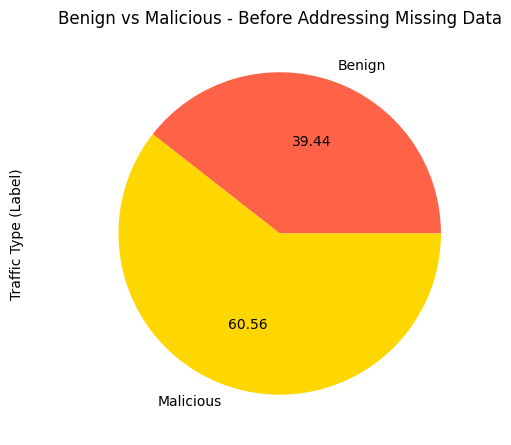

In [15]:
fig, ax2 = plt.subplots(ncols=1, figsize=(5, 5))
df.groupby('Label').size().plot(kind='pie', autopct='%.2f', colors=['tomato', 'gold'], textprops={'fontsize': 10})
ax2.set_ylabel('Traffic Type (Label)\n\n\n', size=10)
plt.tight_layout()
plt.title('Benign vs Malicious - Before Addressing Missing Data')
plt.savefig('images/pie_benign_malicious_before_cleaning_data.png')
plt.show()


In [16]:
sns.reset_orig() 
plt.close()
plt.clf()

In [17]:
print('Shape before treating duplicates: ' + str(df.shape))
print('Duplicates : ' + str(df.duplicated().sum()))


Shape before treating duplicates: (100000, 49)
Duplicates : 0


#### Will address duplicates after addressing features with more than 80% missing data.

#### Features with missing data above 77% will be dropped.

In [18]:
# Address Missing Data 
# Data without features that have 77% or greater missing values

In [19]:
df_org = df.copy(deep=True)

In [20]:
columns = df.columns
val = df.isna().mean().mul(100).round(2)
nul_columns = []
for col in columns:
    if val[col] > 76 :
        nul_columns.append(col)

In [21]:
df = pd.DataFrame(df_org.drop(nul_columns, axis=1))

In [22]:
df.dropna(inplace=True)
df.isna().mean().mul(100).round(2)

index          0.0
Dur            0.0
RunTime        0.0
Mean           0.0
Sum            0.0
Min            0.0
Max            0.0
Proto          0.0
sTos           0.0
sDSb           0.0
sTtl           0.0
sHops          0.0
TotPkts        0.0
SrcPkts        0.0
DstPkts        0.0
TotBytes       0.0
SrcBytes       0.0
DstBytes       0.0
Offset         0.0
sMeanPktSz     0.0
dMeanPktSz     0.0
Load           0.0
SrcLoad        0.0
DstLoad        0.0
Loss           0.0
SrcLoss        0.0
DstLoss        0.0
pLoss          0.0
Rate           0.0
SrcRate        0.0
DstRate        0.0
State          0.0
TcpRtt         0.0
SynAck         0.0
AckDat         0.0
Label          0.0
Attack Type    0.0
dtype: float64

In [23]:
#Lets examine frequency category occurance

col_list = df.select_dtypes(include=['object', 'category']).columns.tolist()
print('_________________________________________\n')
for col in col_list:
    print('Feature: ' + str(col))
    category = df[col].value_counts().div(df.shape[0]).mul(100).round(2)
    category_df = category.reset_index()
    category_df.columns = ['category', 'freq in %']
    print(category_df)
    print('_________________________________________\n')

_________________________________________

Feature: Proto
    category  freq in %
0        udp      74.36
1        tcp      22.83
2       icmp       2.45
3       sctp       0.36
4  ipv6-icmp       0.00
_________________________________________

Feature: sDSb
   category  freq in %
0       cs0      99.49
1        ef       0.29
2      af11       0.06
3       cs6       0.05
4      af41       0.04
5       cs7       0.03
6      af12       0.01
7        52       0.01
8       cs4       0.01
9         4       0.00
10       39       0.00
_________________________________________

Feature: State
   category  freq in %
0       REQ      48.31
1       INT      27.26
2       CON      10.81
3       RST       6.32
4       FIN       4.75
5       ECO       2.39
6       ACC       0.09
7       URP       0.06
8       RSP       0.00
9       TST       0.00
10      NRS       0.00
_________________________________________

Feature: Label
    category  freq in %
0  Malicious      60.58
1     Benign      39.42
_

In [24]:
print(df.shape)
print('Duplicates : ' + str(df.duplicated().sum()))
# remove duplicates
df.drop_duplicates(inplace = True)
print('Shape post treating duplicates: ' + str(df.shape))

(99976, 37)
Duplicates : 0
Shape post treating duplicates: (99976, 37)


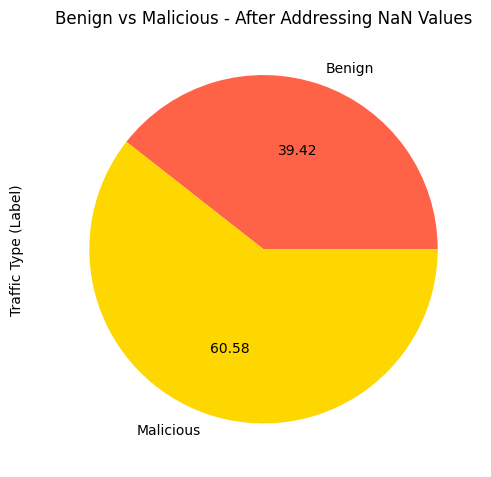

In [26]:
fig, ax2 = plt.subplots(ncols=1, figsize=(5, 5))
df.groupby('Label').size().plot(kind='pie', autopct='%.2f', colors=['tomato', 'gold'], textprops={'fontsize': 10})
ax2.set_ylabel('Traffic Type (Label)\n', size=10)
plt.tight_layout()
plt.title('Benign vs Malicious - After Addressing NaN Values')
plt.savefig('images/pie_benign_malicious_after_cleaning_data.png')
plt.show()

Do we have imbalance in Attack Type classes?

Label      Attack Type   
Malicious  ICMPFlood           107
           SYNFlood            755
           UDPScan            1321
           TCPConnectScan     1627
           SYNScan            1649
           SlowrateDoS        5961
           HTTPFlood         11608
           UDPFlood          37536
Benign     Benign            39412
dtype: int64

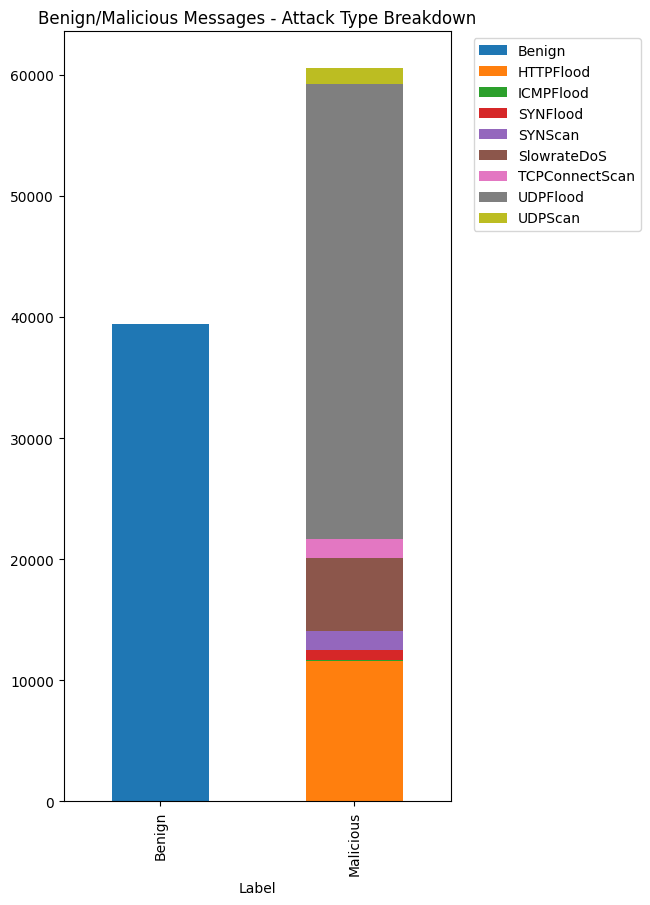

In [27]:
fig,ax = plt.subplots(figsize=(5, 10))
attack_counts = df.groupby(['Label', 'Attack Type']).size()
display(attack_counts.sort_values())
attack_counts.unstack('Attack Type')\
    .plot(kind='bar', stacked=True, ax=ax)
ax.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
ax.xaxis.grid(False)
plt.title('Benign/Malicious Messages - Attack Type Breakdown')
plt.savefig('images/benign_malicious_attacktype.png')
plt.show()

Indeed, we do see class imbalances when it comes to Attack Type (classification of malicious attacks). The most noticeable are between:

UDPFlood
UDPScan
TCPConnectScan
SYNScan
SYNFlood


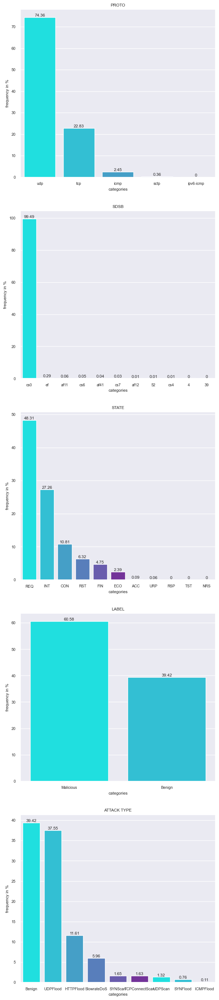

In [28]:
sns.set(style="darkgrid",font_scale=0.7)
col_list = df.select_dtypes(include=['object', 'category']).columns.tolist()
fig, axs = plt.subplots(len(col_list), 1, figsize=(7, 35))
i = 0
for col in col_list:
    category = df[col].value_counts().div(df.shape[0]).mul(100).round(2)
    category_df = category.reset_index()
    category_df.columns = ['categories', 'frequency']
    ax = sns.barplot(x = category_df.categories, y=category_df.frequency, ci=None, palette=sns.color_palette('blend:#0FF,#72A'), ax=axs[i])
    ax.set_title(str(col).upper()) 
    ax.set_ylabel("frequency in %")
    for container in ax.containers:
        ax.bar_label(container)
    i = i + 1

plt.savefig('images/bar_categories.png')
plt.show()
    

#### Indeed, we do see class imbalances when it comes to Attack Type (classification of malicious attacks). The most noticeable are:

- UDPFlood
- UDPScan
- TCPConnectScan
- SYNScan
- SYNFlood
- ICMPFlood

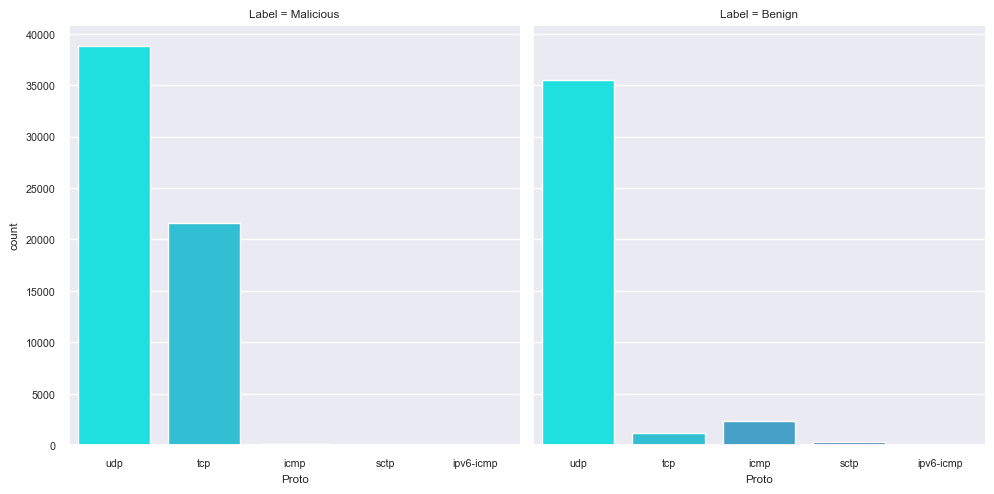

In [29]:
countplots = partial(sns.catplot, data=df, kind='count', col_wrap=3, palette=sns.color_palette('blend:#0FF,#72A'))
countplots(x='Proto', col='Label', col_wrap=2)
plt.savefig('images/proto_benign_malicious.png')
plt.show()

In [30]:
# Lets 
df_trans =df.copy(deep=True)
df_trans['Label'] = df_trans['Label'].replace({'Benign': 0, 'Malicious': 1})

In [31]:
def plot_cat_func(attr):
    df_proto = pd.merge( df_trans[df_trans['Label']==1].groupby([attr]).size().to_frame(), \
               df_trans[df_trans['Label']==0].groupby([attr]).size().to_frame(), \
                left_on=attr, right_on=attr, how='outer')

    df_tmp = pd.DataFrame(df_proto)
    df_tmp.rename(columns = {'0_x':'Malicious', '0_y':'Benign'}, inplace=True);
    df_tmp.reset_index(inplace=True)
    dfm = pd.melt(df_tmp, id_vars=attr, var_name='Traffic Type', value_name='Count')
    plt.close()
    sns.set(style="darkgrid",font_scale=0.8)
    grid = sns.catplot(x=attr, y='Count', hue='Traffic Type', data=dfm, kind='bar', height=5, aspect=2, \
                       palette=["darkred", "seagreen"])
    ax = grid.axes[0, 0]
    for container in ax.containers:
        ax.bar_label(container)

    plt.xticks(rotation=60) 
    plt.title('\nMalicious Vs Benign Distribution per ' + str(attr) + ' Category');
    plt.savefig('images/' + str(attr) + '_benign_malicious_distribution.png', bbox_inches='tight')
    plt.show()
    plt.close()
    return 

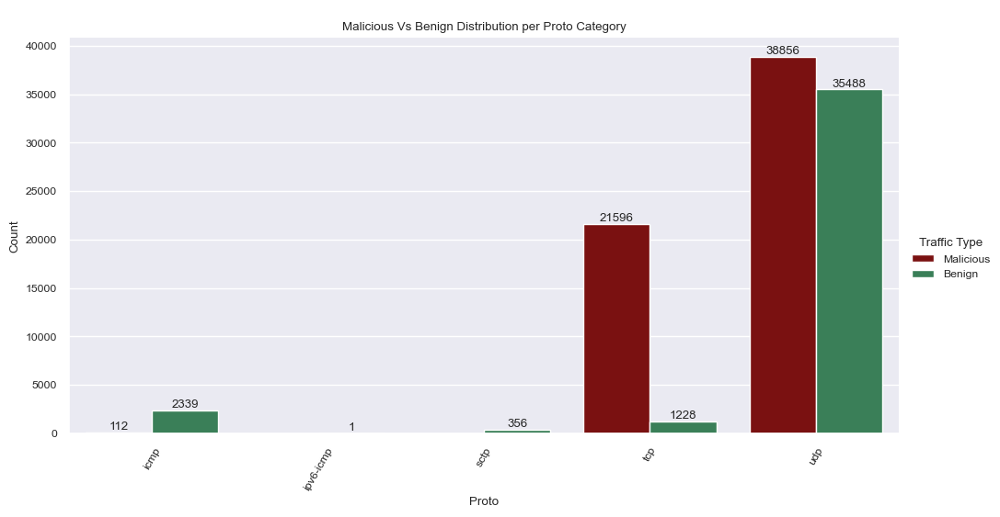

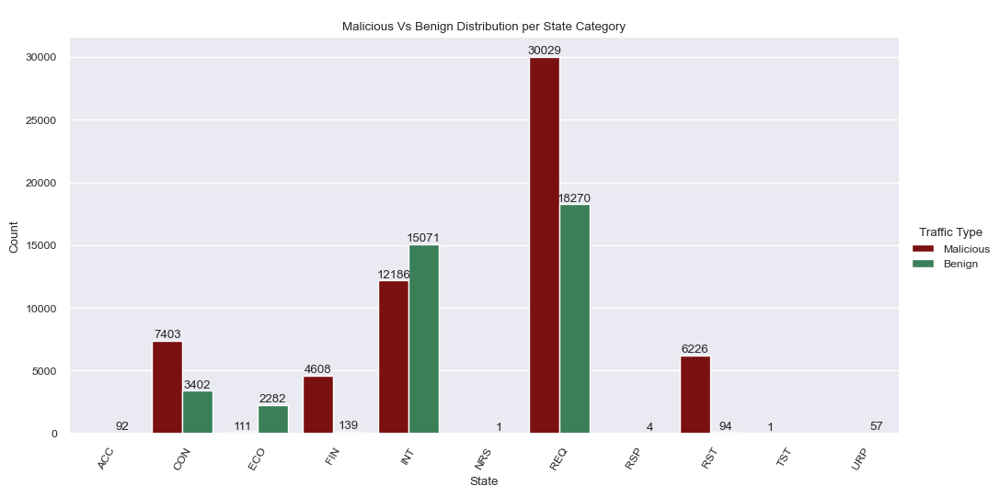

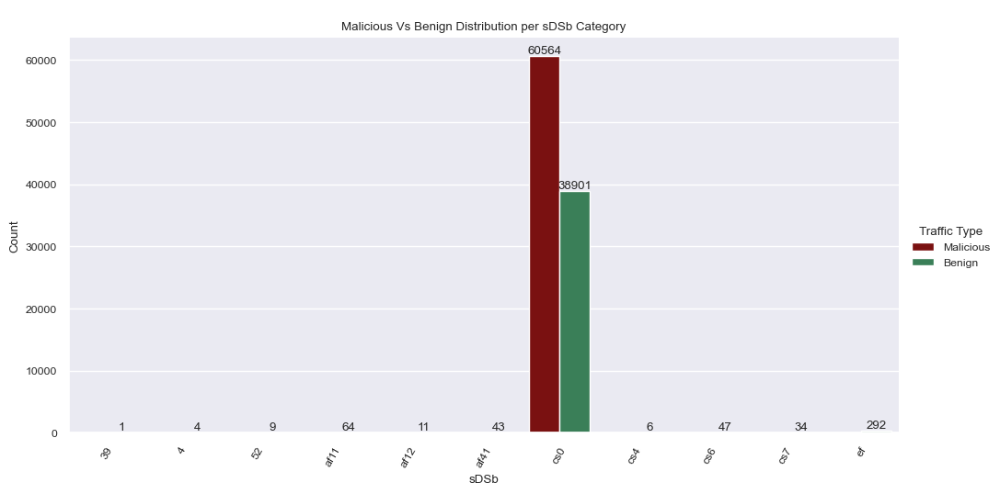

In [32]:

plot_cat_func('Proto')
plot_cat_func('State')
plot_cat_func('sDSb')

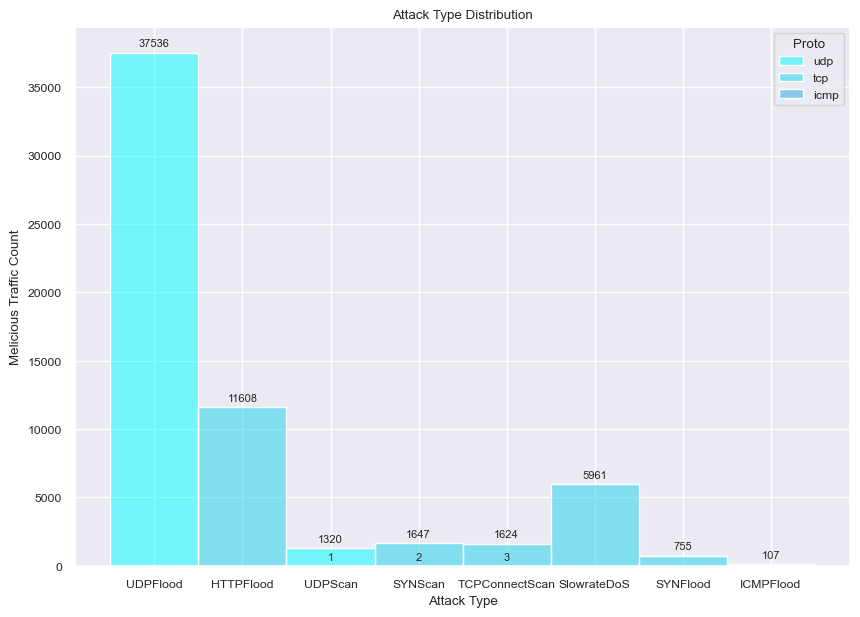

In [43]:
# Drill down
fig, ax = plt.subplots(figsize=(10, 7))
sns.set(style="darkgrid",font_scale=0.8)
ax = sns.histplot(data=df_trans[df_trans['Label']==1], x='Attack Type', hue='Proto', palette=sns.color_palette('blend:#0FF,#72A'), ax=ax)
ax.set_title("Attack Type Distribution")
ax.set_xlabel("Attack Type")
ax.set_ylabel("Melicious Traffic Count")
for c in ax.containers:
    labels = [f'{h:0}' if (h := v.get_height()) != 0 else '' for v in c ]
    ax.bar_label(c, labels=labels, fontsize=8, padding=3)
plt.savefig('images/attack_type_dist.png', bbox_inches='tight')
plt.show()

#### Drill down on Melicious messages at an Attack Level

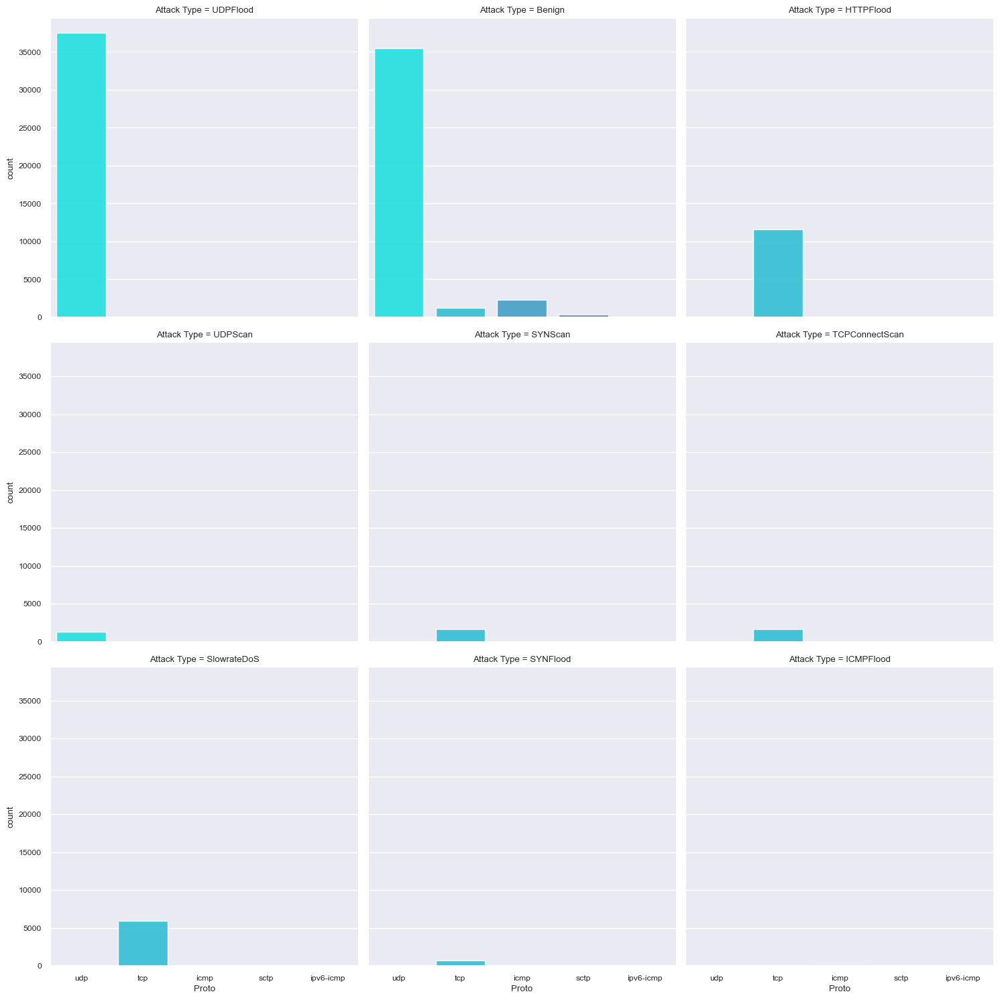

In [38]:
countplots = partial(sns.catplot, data=df, kind='count', col_wrap=3, palette=sns.color_palette('blend:#0FF,#72A'), alpha=0.9)
countplots(x='Proto', col='Attack Type', col_wrap=3)
plt.savefig('images/proto_attacktypes.png',bbox_inches='tight')
plt.show()

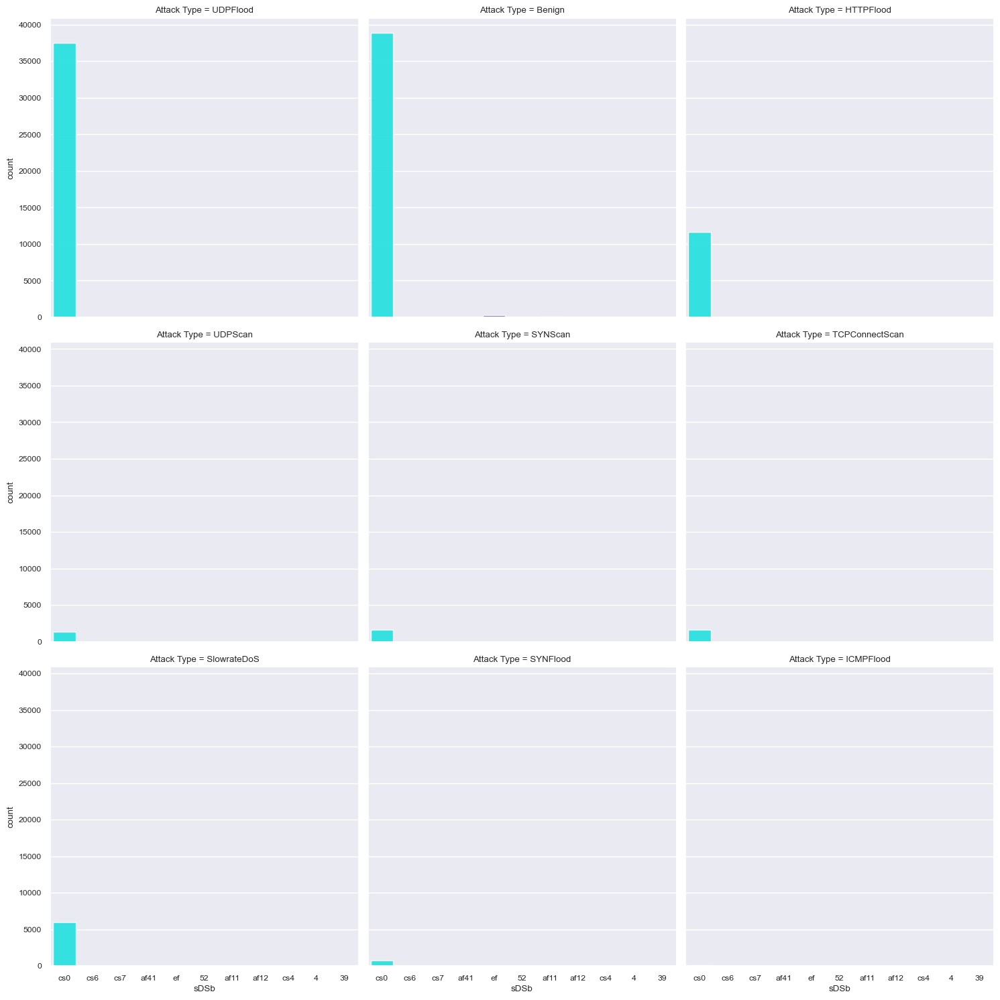

In [39]:
countplots = partial(sns.catplot, data=df, kind='count', col_wrap=3, palette=sns.color_palette('blend:#0FF,#72A'), alpha=0.9)
countplots(x='sDSb', col='Attack Type', col_wrap=3)
plt.savefig('images/sdsb_attacktypes.png',bbox_inches='tight')
plt.show()

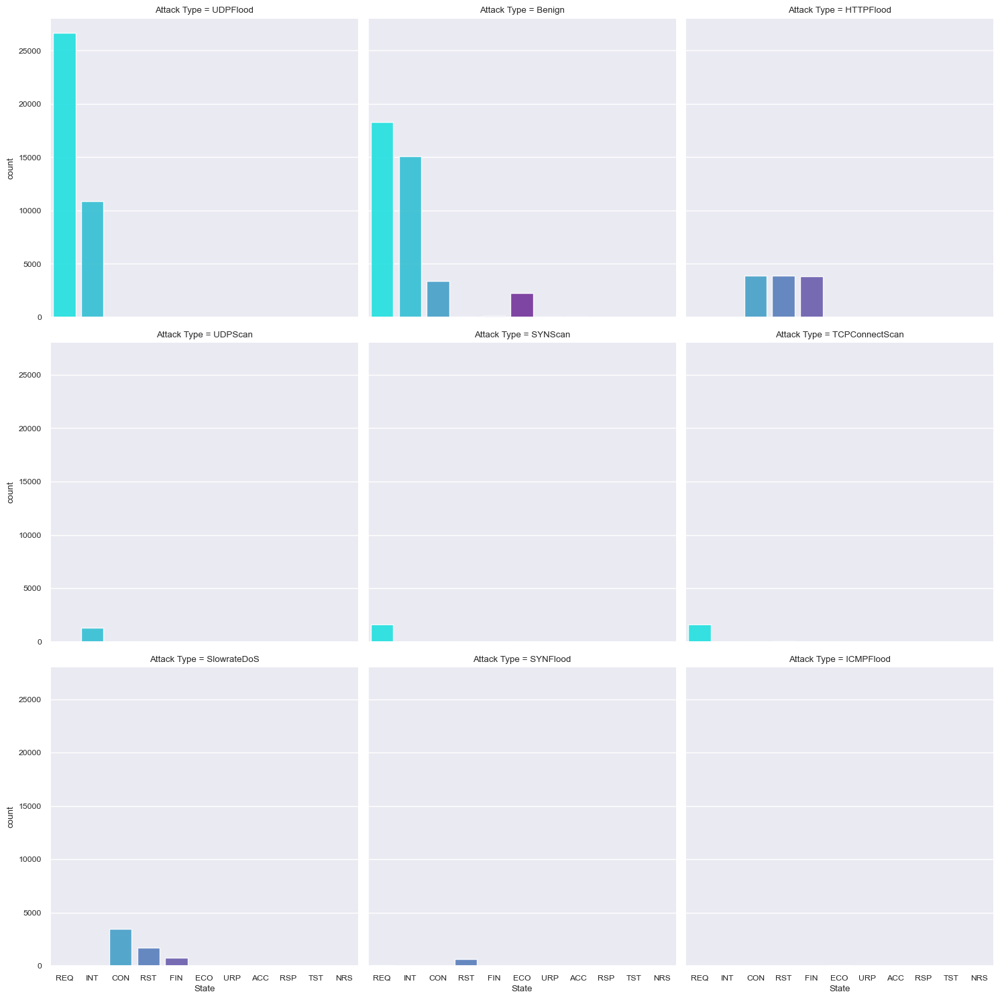

In [40]:
countplots = partial(sns.catplot, data=df, kind='count', col_wrap=3, palette=sns.color_palette('blend:#0FF,#72A'), alpha=0.9)
countplots(x='State', col='Attack Type', col_wrap=3)
plt.savefig('images/state_attacktypes.png', bbox_inches='tight')
plt.show()

### Lets examine the numerical features against Labels

### Understanding the Task & how to proceed
Per the problem statement, we will have two levels of preditions - Label and Attack Type. The classification approach will be as follows:
- Lable will be binary classification
- Attack Type will be multi-class classification using one-versus-one strategy.
- a) Because 'Attack Type' multiclass is what we will predict, ordinal encoder method will be used.
- b) Rest of categorical features will be encoded using OneHot encoding
- c) Multi-collinearity will be addressed by dropping features with correlation above 70%
- d) The 'Attack Tool' features will be dropped since it is captured in the 'Attack Type'. Additionally, 'Attack Tool' is not relevent to our problem statement.
    

### Starting with examining the numerical features and identify the ones that can be dropped

In [44]:
# The 'Attack Tool' features will be dropped since the the former captured in the 'Attack Type' and 'Attack Tool' is not relevent to our problem statement.

#Ordinal encoder
dict = {'Benign': 0, 'UDPFlood': 1, 'HTTPFlood': 2, 'SlowrateDoS': 3, 'TCPConnectScan': 4, 'SYNScan': 5, 'UDPScan': 6, 'SYNFlood': 7, 'ICMPFlood': 8}

# Continue uding df_trans since 'Label' is already transformed to numerical
df_trans.replace({'Attack Type':dict},inplace=True);


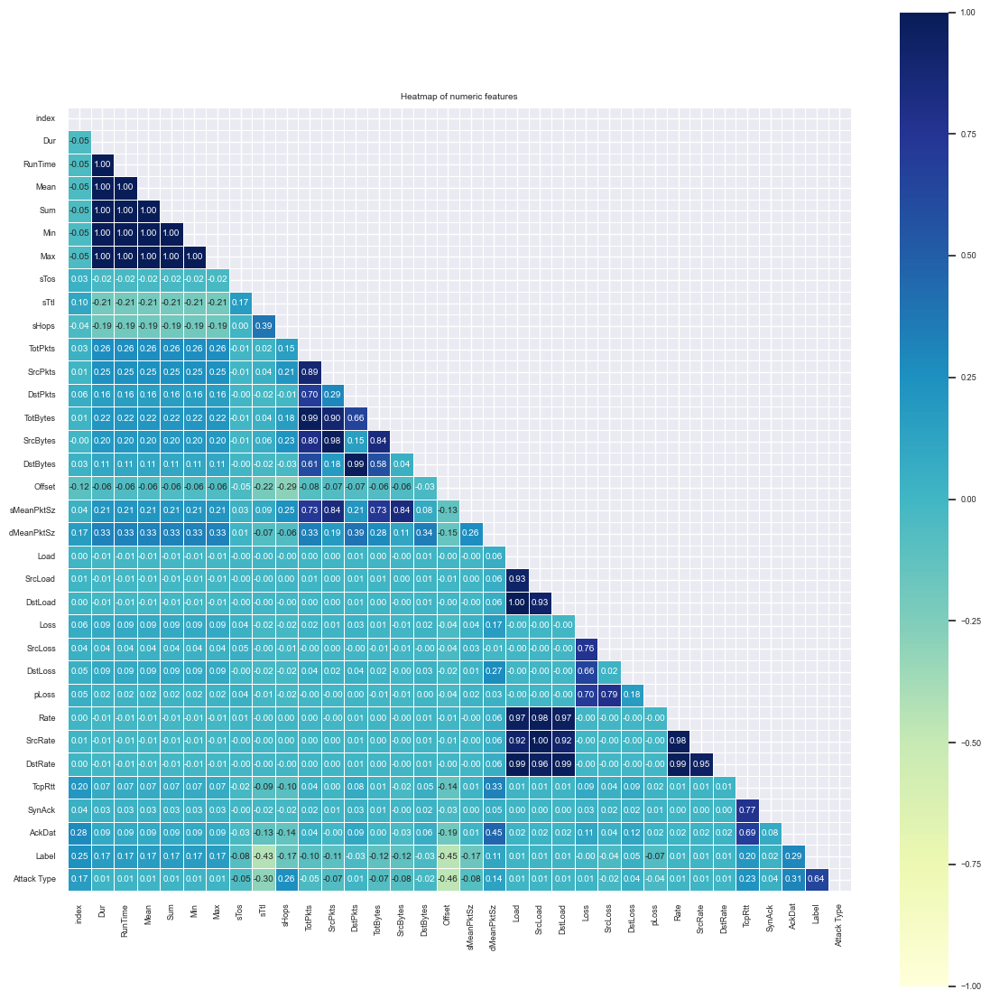

In [45]:
plt.figure(figsize = (14,14))
plt.rcParams.update({'font.size': 6})
numeric_corr = df_trans.corr(numeric_only=True)
sns.set(style="darkgrid",font_scale=0.6)
mask = np.triu(np.ones_like(numeric_corr, dtype=bool))
sns.heatmap(numeric_corr, cmap="YlGnBu", vmin = -1, vmax = 1, center = 0, annot=True, fmt=".2f", square=True, linewidths=.5, mask = mask)
plt.title("Heatmap of numeric features")
plt.savefig('images/heatmap_identify_relevent_features.png', bbox_inches='tight')
plt.show()

In [46]:
sns.reset_orig() 
plt.close()
plt.clf()

In [47]:
numerical_columns = df_trans.select_dtypes(include=['int64', 'float64']).columns
corr_matrix = df_trans[numerical_columns].corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find index of feature columns with correlation greater than a user set value 0.80
TO_DROP = [column for column in upper.columns if any(upper[column] > 0.80)]
print("Features to Drop:",TO_DROP)

df_trans.drop(TO_DROP, axis=1, inplace=True)


Features to Drop: ['RunTime', 'Mean', 'Sum', 'Min', 'Max', 'SrcPkts', 'TotBytes', 'SrcBytes', 'DstBytes', 'sMeanPktSz', 'SrcLoad', 'DstLoad', 'Rate', 'SrcRate', 'DstRate']


In [48]:
# Lets examine the numerical features against 'Label' & 'Attack Type'
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
df_numb = df[numerical_columns].copy(deep=True)
df_numb.drop(TO_DROP, axis=1, inplace=True)

In [49]:
df_numb['Label'] = df['Label']
sns.reset_orig() 
plt.close()
plt.clf()
sns.set_style('whitegrid')
sns_plot = sns.pairplot(df_numb, hue='Label', diag_kind='kde', corner=True, palette = {'darkred','seagreen'})
sns_plot.savefig("images/pairplot_numeric_features_label.png")
plt.clf()

In [50]:
sns.reset_orig() 
plt.close()
plt.clf()

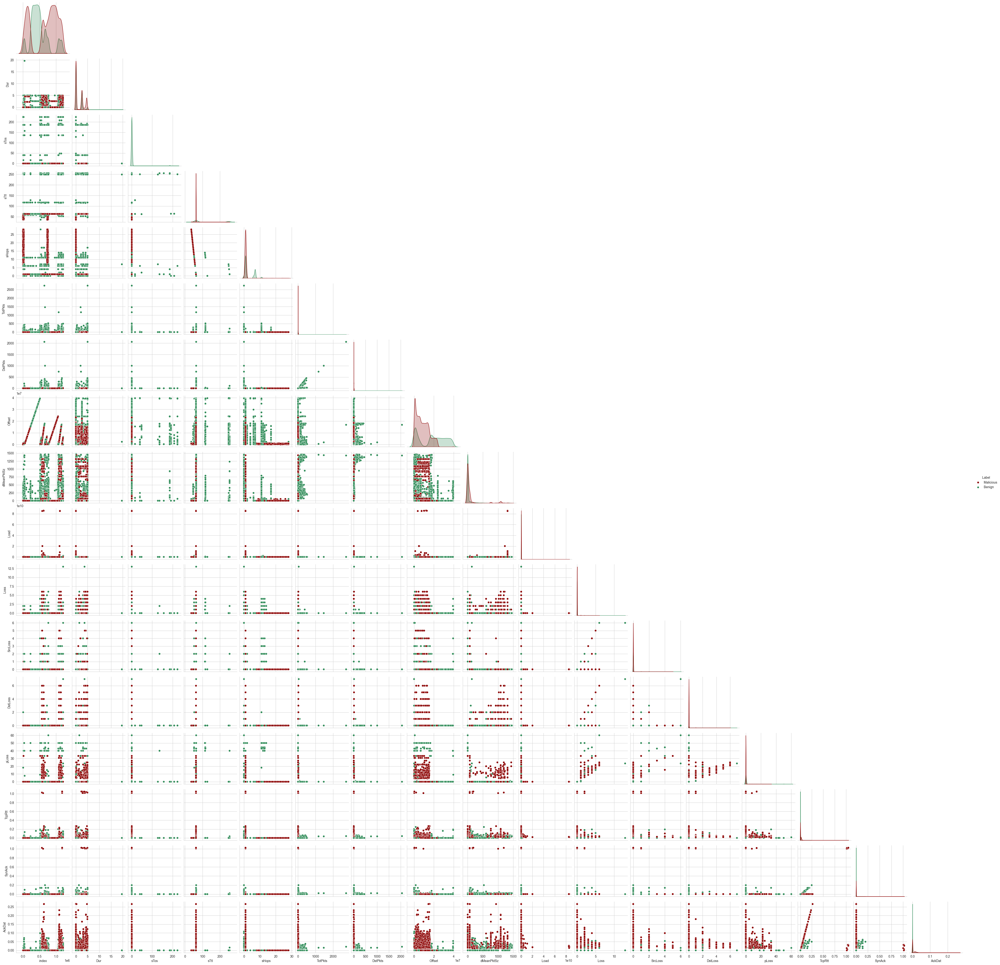

In [51]:
from IPython.display import Image
Image(filename='images/pairplot_numeric_features_label.png') 

In [52]:
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
df_tmp = df[numerical_columns].copy(deep=True)
df_tmp['Attack Type'] = df['Attack Type']
df_numb = df_tmp[(df_tmp['Attack Type'] != 'Benign')].copy(deep=True)
df_numb.drop(TO_DROP, axis=1, inplace=True)

In [53]:
#df_numb.drop('Label', axis=1, inplace=True)
sns.reset_orig() 
plt.close()
plt.clf()
sns.set_style('whitegrid')
sns_plot = sns.pairplot(df_numb, hue='Attack Type', diag_kind='kde', corner=True, palette='CMRmap')
sns_plot.savefig("images/pairplot_numeric_features_attack_type.png")
plt.clf()

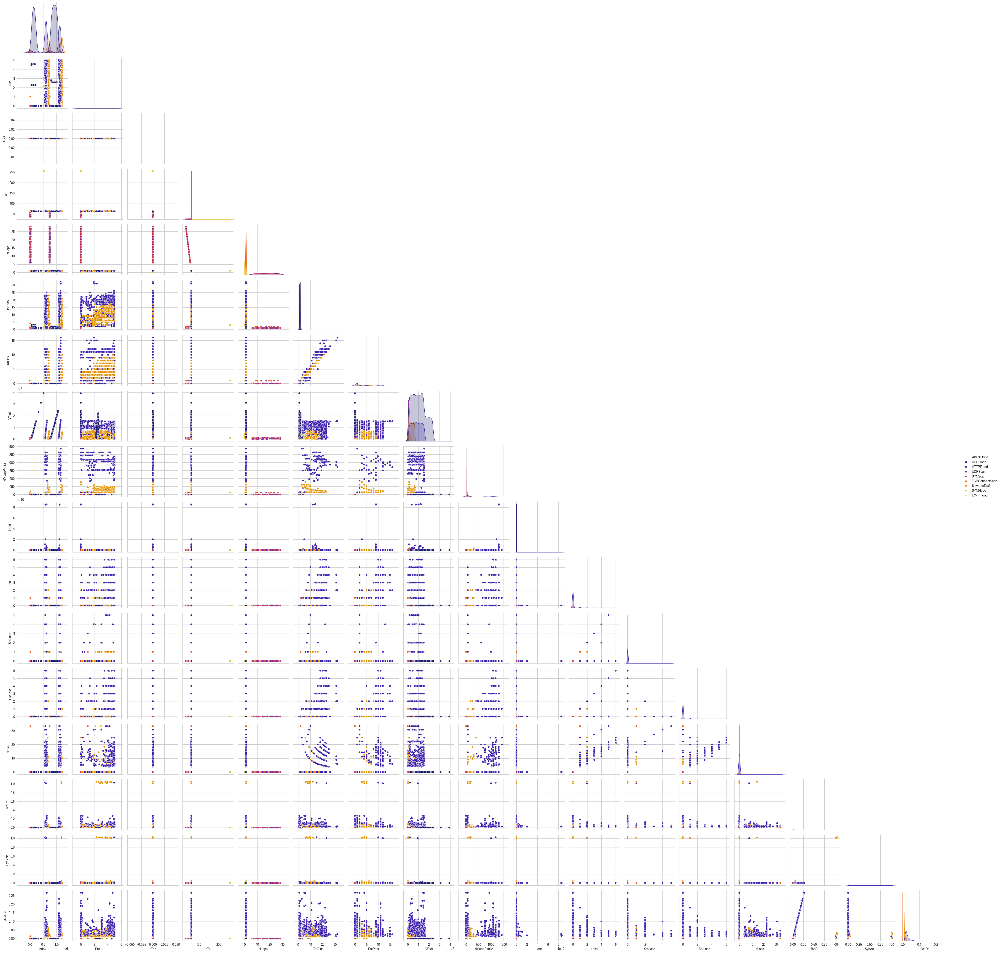

In [54]:
Image(filename='images/pairplot_numeric_features_attack_type.png') 

In [55]:
sns.reset_orig() 
plt.close()
plt.clf()

### Engineering Features

Per the business objective, we will build a basic model to get started.  Before we can do this, we must work to encode the data and repare the features and target column for modeling with appropriate encoding and transformations.

In [56]:
#OneHotEncoding
categorical_columns = df_trans.select_dtypes(include=['object', 'category']).columns

encoder = OneHotEncoder(sparse_output=False)
one_hot_encoded = encoder.fit_transform(df_trans[categorical_columns])
one_hot_df = pd.DataFrame(one_hot_encoded, columns=encoder.get_feature_names_out(categorical_columns)).reset_index()
tmp_data = df_trans.drop(categorical_columns, axis=1).reset_index()
clean_df = pd.concat([tmp_data, one_hot_df], axis=1)
clean_df.drop('index', axis=1, inplace=True)

<Figure size 640x480 with 0 Axes>

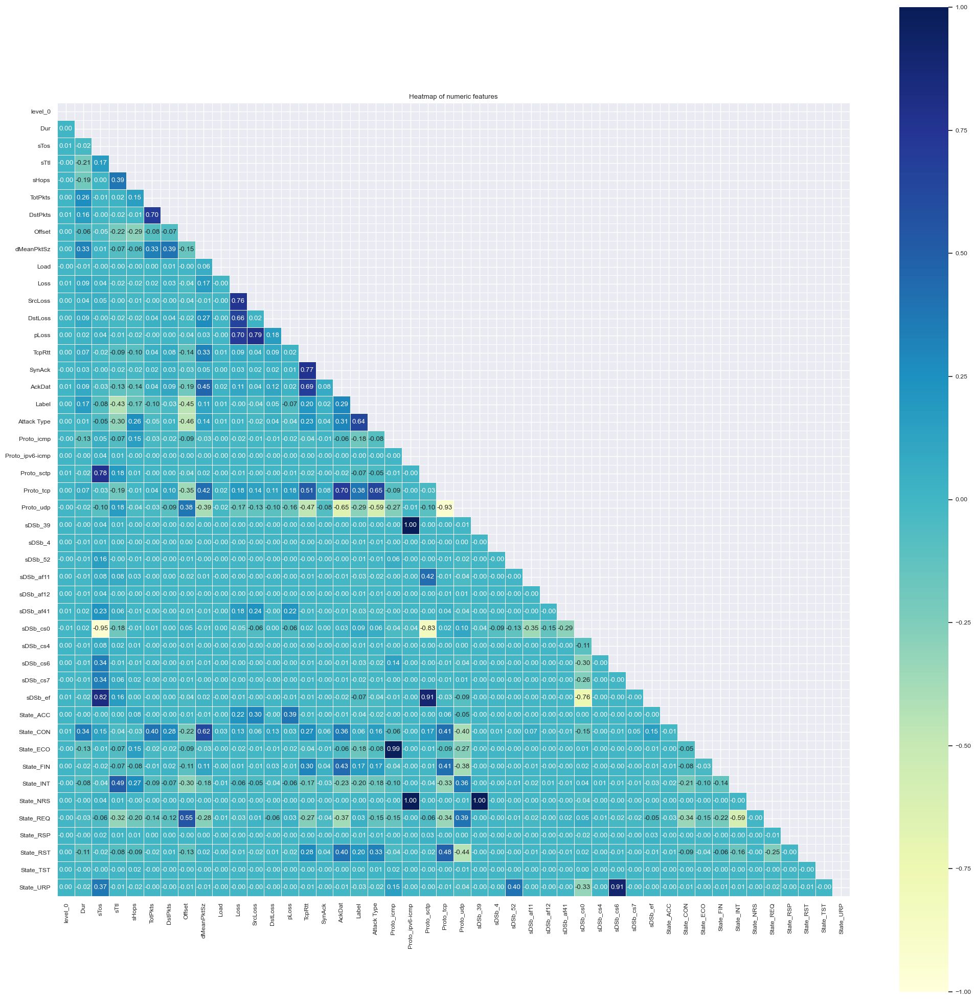

In [57]:
plt.figure(figsize = (25,25))
plt.rcParams.update({'font.size': 8})
numeric_corr = clean_df.corr(numeric_only=True)
sns.set(style="darkgrid",font_scale=0.8)
mask = np.triu(np.ones_like(numeric_corr, dtype=bool))
sns.heatmap(numeric_corr, cmap="YlGnBu", vmin = -1, vmax = 1, center = 0, annot=True, fmt=".2f", square=True, linewidths=.5, mask = mask)
plt.title("Heatmap of numeric features")
plt.savefig('images/heatmap_numeric_features_encoded.png', bbox_inches='tight')
plt.show()
plt.close()
plt.clf()

In [58]:
sns.reset_orig() 
plt.close()
plt.clf()

In [59]:
numerical_columns = clean_df.select_dtypes(include=['int64', 'float64']).columns
corr_matrix = clean_df[numerical_columns].corr().abs()

   
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))


# Find index of feature columns with correlation greater than a user set value 0.80
TO_DROP = [column for column in upper.columns if any(upper[column] > 0.80)]
print("Features to Drop:",TO_DROP)

#clean_df.drop(TO_DROP, axis=1, inplace=True)

Features to Drop: ['Proto_udp', 'sDSb_39', 'sDSb_cs0', 'sDSb_ef', 'State_ECO', 'State_NRS', 'State_URP']


In [60]:
Will_Drop = TO_DROP
clean_df.drop(Will_Drop, axis=1, inplace=True)

<Figure size 640x480 with 0 Axes>

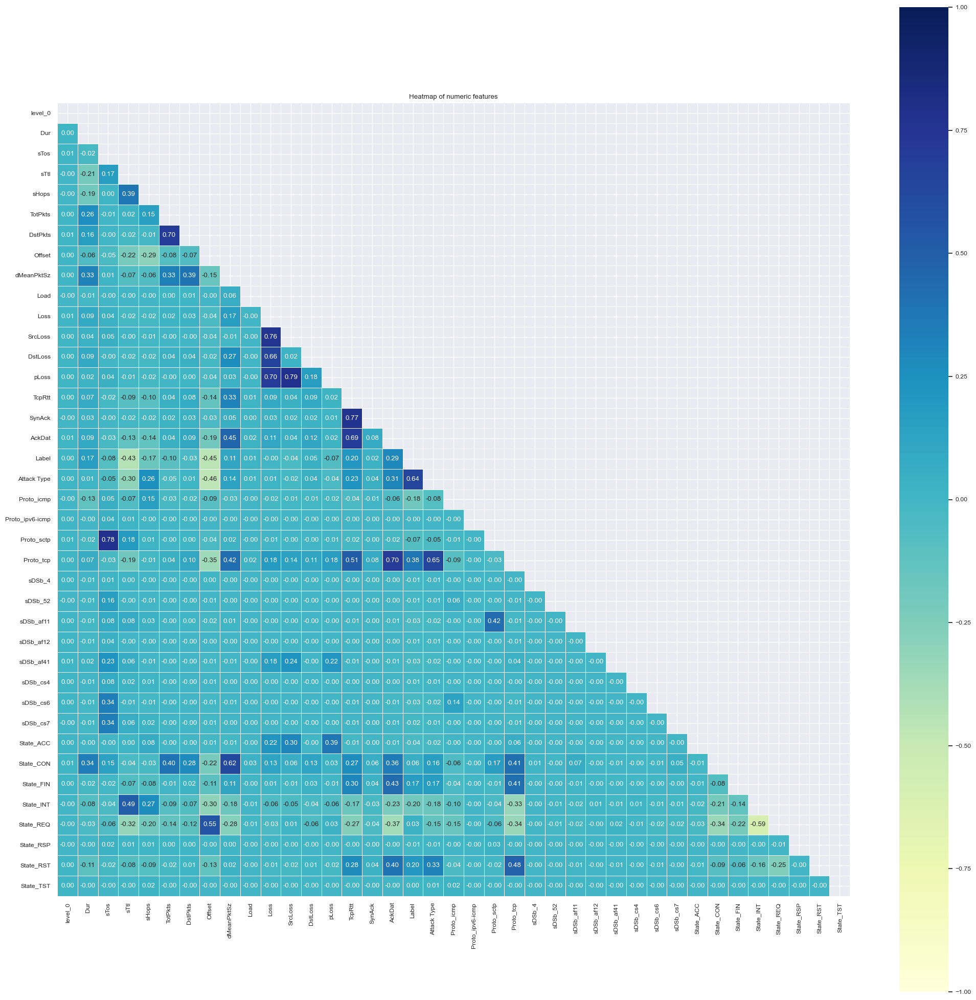

In [61]:
plt.figure(figsize = (25,25))
plt.rcParams.update({'font.size': 8})
numeric_corr = clean_df.corr(numeric_only=True)
sns.set(style="darkgrid",font_scale=0.8)
mask = np.triu(np.ones_like(numeric_corr, dtype=bool))
sns.heatmap(numeric_corr, cmap="YlGnBu", vmin = -1, vmax = 1, center = 0, annot=True, fmt=".2f", square=True, linewidths=.5, mask = mask)
plt.title("Heatmap of numeric features")
plt.savefig('images/heatmap_identify_relevent_features_encoded_cleaned.png', bbox_inches='tight')
plt.show()
plt.close()
plt.clf()

In [62]:
sns.reset_orig() 
plt.close()
plt.clf()

In [63]:
data = clean_df
clean_df.shape

(99976, 39)

In [64]:
print(data.info())
print(data.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99976 entries, 0 to 99975
Data columns (total 39 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   level_0          99976 non-null  int64  
 1   Dur              99976 non-null  float64
 2   sTos             99976 non-null  float64
 3   sTtl             99976 non-null  float64
 4   sHops            99976 non-null  float64
 5   TotPkts          99976 non-null  int64  
 6   DstPkts          99976 non-null  int64  
 7   Offset           99976 non-null  int64  
 8   dMeanPktSz       99976 non-null  float64
 9   Load             99976 non-null  float64
 10  Loss             99976 non-null  int64  
 11  SrcLoss          99976 non-null  int64  
 12  DstLoss          99976 non-null  int64  
 13  pLoss            99976 non-null  float64
 14  TcpRtt           99976 non-null  float64
 15  SynAck           99976 non-null  float64
 16  AckDat           99976 non-null  float64
 17  Label       

### Train/Test Split - One for Binary classification and the other for Multi-class classification

With your data prepared, split it into a train and test set.

In [65]:
test_size = 0.3
random_state = 42

In [66]:
# Train/Test split for binary classification - 'Label' - Melicious attack detection
Xbin = data.drop(['Attack Type', 'Label'], axis=1) 
ybin = data['Label']
Xbin_train_tmp, Xbin_test_tmp, ybin_train, ybin_test = train_test_split(Xbin, ybin, test_size=test_size, random_state=random_state)

scaler_train = StandardScaler()
Xbin_train = pd.DataFrame(scaler_train.fit_transform(Xbin_train_tmp), columns=Xbin_train_tmp.columns)
scaler_test = StandardScaler()
Xbin_test = pd.DataFrame(scaler_test.fit_transform(Xbin_test_tmp), columns=Xbin_test_tmp.columns)

print( "Xbin_train shape = " + str(Xbin_train.shape) + "\n Xbin_test shape = " + str(Xbin_test.shape))
print( "ybin_train shape = " + str(ybin_train.shape) + "\n ybin_test shape = " + str(ybin_test.shape))
Xbin_train.head()

Xbin_train shape = (69983, 37)
 Xbin_test shape = (29993, 37)
ybin_train shape = (69983,)
 ybin_test shape = (29993,)


,level_0,Dur,sTos,sTtl,sHops,TotPkts,DstPkts,Offset,dMeanPktSz,Load,Loss,SrcLoss,DstLoss,pLoss,TcpRtt,SynAck,AckDat,Proto_icmp,Proto_ipv6-icmp,Proto_sctp,Proto_tcp,sDSb_4,sDSb_52,sDSb_af11,sDSb_af12,sDSb_af41,sDSb_cs4,sDSb_cs6,sDSb_cs7,State_ACC,State_CON,State_FIN,State_INT,State_REQ,State_RSP,State_RST,State_TST
0,-0.294618,0.720003,-0.069182,-0.333087,-0.353128,-0.122447,-0.111416,0.693212,-0.286001,-0.010133,-0.100388,-0.080038,-0.062391,-0.098954,-0.274138,-0.045576,-0.381555,-0.157929,-0.00378,-0.061184,-0.542983,-0.00756,-0.010692,-0.027005,-0.010692,-0.020006,-0.006547,-0.022369,-0.020006,-0.031642,-0.346897,-0.223800,-0.609654,1.029838,-0.00756,-0.259771,-0.00378
1,0.829196,1.903937,-0.069182,-0.333087,-0.353128,-0.122447,-0.111416,-0.485651,-0.286001,-0.010133,-0.100388,-0.080038,-0.062391,-0.098954,-0.274138,-0.045576,-0.381555,-0.157929,-0.00378,-0.061184,-0.542983,-0.00756,-0.010692,-0.027005,-0.010692,-0.020006,-0.006547,-0.022369,-0.020006,-0.031642,-0.346897,-0.223800,-0.609654,1.029838,-0.00756,-0.259771,-0.00378
2,-0.137235,0.551559,-0.069182,-0.333087,-0.353128,-0.122447,-0.111416,-0.005500,-0.286001,-0.010132,-0.100388,-0.080038,-0.062391,-0.098954,-0.274138,-0.045576,-0.381555,-0.157929,-0.00378,-0.061184,-0.542983,-0.00756,-0.010692,-0.027005,-0.010692,-0.020006,-0.006547,-0.022369,-0.020006,-0.031642,-0.346897,-0.223800,-0.609654,1.029838,-0.00756,-0.259771,-0.00378
3,-1.715936,1.779365,-0.069182,-0.333087,-0.353128,0.503027,0.735918,-0.490266,4.813713,-0.010103,-0.100388,-0.080038,-0.062391,-0.098954,1.253659,0.131864,1.832953,-0.157929,-0.00378,-0.061184,1.841678,-0.00756,-0.010692,-0.027005,-0.010692,-0.020006,-0.006547,-0.022369,-0.020006,-0.031642,2.882701,-0.223800,-0.609654,-0.971027,-0.00756,-0.259771,-0.00378
4,1.394112,-0.808060,-0.069182,-0.333087,-0.353128,-0.122447,-0.034386,-0.637469,0.023486,-0.010133,-0.100388,-0.080038,-0.062391,-0.098954,1.740533,0.053290,2.694088,-0.157929,-0.00378,-0.061184,1.841678,-0.00756,-0.010692,-0.027005,-0.010692,-0.020006,-0.006547,-0.022369,-0.020006,-0.031642,-0.346897,4.468282,-0.609654,-0.971027,-0.00756,-0.259771,-0.00378


In [67]:
# Train/Test split for multi-class classification - 'Attack Type' - Determine type of melicious attack
Xmc = data.drop(['Attack Type', 'Label'], axis=1) 
ymc = data['Attack Type']
Xmc_train_tmp, Xmc_test_tmp, ymc_train, ymc_test = train_test_split(Xmc, ymc, test_size=test_size, random_state=random_state)

scaler_train = StandardScaler()
Xmc_train = pd.DataFrame(scaler_train.fit_transform(Xmc_train_tmp), columns=Xmc_train_tmp.columns)
scaler_test = StandardScaler()
Xmc_test = pd.DataFrame(scaler_test.fit_transform(Xmc_test_tmp), columns=Xmc_test_tmp.columns)

print( "Xmc_train shape = " + str(Xmc_train.shape) + "\n Xmc_test shape = " + str(Xmc_test.shape))
print( "ymc_train shape = " + str(ymc_train.shape) + "\n ymc_test shape = " + str(ymc_test.shape))
Xmc_train.head()

Xmc_train shape = (69983, 37)
 Xmc_test shape = (29993, 37)
ymc_train shape = (69983,)
 ymc_test shape = (29993,)


,level_0,Dur,sTos,sTtl,sHops,TotPkts,DstPkts,Offset,dMeanPktSz,Load,Loss,SrcLoss,DstLoss,pLoss,TcpRtt,SynAck,AckDat,Proto_icmp,Proto_ipv6-icmp,Proto_sctp,Proto_tcp,sDSb_4,sDSb_52,sDSb_af11,sDSb_af12,sDSb_af41,sDSb_cs4,sDSb_cs6,sDSb_cs7,State_ACC,State_CON,State_FIN,State_INT,State_REQ,State_RSP,State_RST,State_TST
0,-0.294618,0.720003,-0.069182,-0.333087,-0.353128,-0.122447,-0.111416,0.693212,-0.286001,-0.010133,-0.100388,-0.080038,-0.062391,-0.098954,-0.274138,-0.045576,-0.381555,-0.157929,-0.00378,-0.061184,-0.542983,-0.00756,-0.010692,-0.027005,-0.010692,-0.020006,-0.006547,-0.022369,-0.020006,-0.031642,-0.346897,-0.223800,-0.609654,1.029838,-0.00756,-0.259771,-0.00378
1,0.829196,1.903937,-0.069182,-0.333087,-0.353128,-0.122447,-0.111416,-0.485651,-0.286001,-0.010133,-0.100388,-0.080038,-0.062391,-0.098954,-0.274138,-0.045576,-0.381555,-0.157929,-0.00378,-0.061184,-0.542983,-0.00756,-0.010692,-0.027005,-0.010692,-0.020006,-0.006547,-0.022369,-0.020006,-0.031642,-0.346897,-0.223800,-0.609654,1.029838,-0.00756,-0.259771,-0.00378
2,-0.137235,0.551559,-0.069182,-0.333087,-0.353128,-0.122447,-0.111416,-0.005500,-0.286001,-0.010132,-0.100388,-0.080038,-0.062391,-0.098954,-0.274138,-0.045576,-0.381555,-0.157929,-0.00378,-0.061184,-0.542983,-0.00756,-0.010692,-0.027005,-0.010692,-0.020006,-0.006547,-0.022369,-0.020006,-0.031642,-0.346897,-0.223800,-0.609654,1.029838,-0.00756,-0.259771,-0.00378
3,-1.715936,1.779365,-0.069182,-0.333087,-0.353128,0.503027,0.735918,-0.490266,4.813713,-0.010103,-0.100388,-0.080038,-0.062391,-0.098954,1.253659,0.131864,1.832953,-0.157929,-0.00378,-0.061184,1.841678,-0.00756,-0.010692,-0.027005,-0.010692,-0.020006,-0.006547,-0.022369,-0.020006,-0.031642,2.882701,-0.223800,-0.609654,-0.971027,-0.00756,-0.259771,-0.00378
4,1.394112,-0.808060,-0.069182,-0.333087,-0.353128,-0.122447,-0.034386,-0.637469,0.023486,-0.010133,-0.100388,-0.080038,-0.062391,-0.098954,1.740533,0.053290,2.694088,-0.157929,-0.00378,-0.061184,1.841678,-0.00756,-0.010692,-0.027005,-0.010692,-0.020006,-0.006547,-0.022369,-0.020006,-0.031642,-0.346897,4.468282,-0.609654,-0.971027,-0.00756,-0.259771,-0.00378


### Cross-validation
    Algorithms to consider:

    - Logistic Regression
    - KNeighborsClassifier
    - DecisionTreeClassifier
    - SVM
    
    

In [68]:
def lists_to_dict (keys, items):
    return {key: item for key,item in zip(keys, items)}

# models names
model_names = ['LR', 'KNN', 'DT', 'SVC']
# param grids for gridsearch
param_grids = [
    {
        'penalty' : ['l1', 'l2', 'none'],
        'C' : np.logspace(-4, 4, 20),
        'solver' : ['lbfgs','newton-cg','sag','saga'],
        'max_iter' : [100, 1000,2500, 5000],
        'multi_class' : ['multinomial']
    },
    { 
        'n_neighbors' : [5,7,9,11,13,15],
        'weights' : ['uniform','distance'],
        'metric' : ['minkowski','euclidean','manhattan']
    },
    {
        'max_depth': [2, 3, 5, 10, 20],
        'min_samples_leaf': [5, 10, 20, 50, 100],
        'criterion': ["gini", "entropy"]
    },
    {
        'C': [0.1, 1, 10, 100, 1000],
        'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
        'kernel': ['rbf', 'linear']
    }  
]

param_grids = lists_to_dict(model_names, param_grids)

# models for gridsearch
models = [
    LogisticRegression(),
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    SVC(probability=True)
]
models = lists_to_dict(model_names, models)

In [69]:
from joblib import dump, load
import copy
import pickle

def n_best (gs_res, n=1):
    ind = np.where(gs_res['rank_test_score'] == n)[0][0]
    mu = gs_res["mean_test_score"][ind]
    std = gs_res["std_test_score"][ind]
    params = gs_res["params"][ind]
    return params, mu, std
   
def grid_search(models, params, X, Y, random_seed=None, silent=False, **kwargs):
    # result dict
    result = []
    rmodels = []
   
    for key in models.keys():
        print(key)
        res = {}
        res['algorithm'] = key
        # set seed
        if random_seed is not None:
            np.random.seed(random_seed)
        x = X
        # gridsearch
        gs = GridSearchCV(estimator=models[key], param_grid=params[key], cv=3, scoring = "accuracy", n_jobs=-1, verbose=1).fit(x, Y)
            
        # best estimator parameters, cross validation mean score and score std
        res['params'], res['mean_score'], res['std_score'] = n_best(gs.cv_results_)
        # save cv_results_
        res['cv_result'] = copy.deepcopy(gs.cv_results_)
        result.append(res)
        print(res)
        rmodels.append(gs.best_estimator_)
    return result, rmodels


In [70]:
# Evalute the ROC
def plot_confusion_matrix_func(class_type, models, X_t, y_t, x, y, x_dim, y_dim):
    sns.reset_orig() 
    fig, ax = plt.subplots(x,y, figsize=(x_dim, y_dim))
    i = 0
    j = 0
    for model in models:
        # Confusion Matrix
        cm = confusion_matrix(y_t, model.predict(X_t))
        disp_cm = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = model.classes_)
        if x > 1:
            disp_cm.plot(ax=ax[i,j])
        else:
            disp_cm.plot(ax=ax[j])

        try:
            fpr, tpr, thresholds = roc_curve(y_t, model.predict_proba(X_t)[:, 1], pos_label=1)
            fp = cm[0][1]
            fn = cm[1][0]
            auc = round(skl_auc(fpr, tpr), 2)
            print("\nModel = " + str(model) + " AUC = " + str(auc))
            #plt.savefig('images/test_dt_confusion_matrix.png')
            if x > 1:
                ax[i,j].set(
                    #xlabel="False Positive Rate",
                    #ylabel="True Positive Rate",
                    title= "Confusion Matrix - " + str(type(model).__name__),
                )
            else:
                ax[j].set(
                    #xlabel="False Positive Rate",
                    #ylabel="True Positive Rate",
                    title= "Confusion Matrix - " + str(type(model).__name__),
                )
        except:
            print("Method does not exit ...")
            
            
        if j == (y-1):
            j = 0
            i = i+1
        else:
            j = j + 1          
            
    plt.savefig('images/confusion_matrix_' + str(class_type) + '.png', bbox_inches='tight')
    plt.show()
    plt.close()
    plt.clf()

### Detecting melicious attack - binary classification model performance

In [71]:
bin_res_dict, rmodels = grid_search(models, param_grids, Xbin_train, ybin_train, random_seed=42)


LR
Fitting 3 folds for each of 960 candidates, totalling 2880 fits


/Users/bashirhaswarey/Projects/AIML/AIML/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1237: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, binary problems will be fit as proper binary  logistic regression models (as if multi_class='ovr' were set). Leave it to its default value to avoid this warning.
  warnings.warn(
/Users/bashirhaswarey/Projects/AIML/AIML/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1237: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, binary problems will be fit as proper binary  logistic regression models (as if multi_class='ovr' were set). Leave it to its default value to avoid this warning.
  warnings.warn(
/Users/bashirhaswarey/Projects/AIML/AIML/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1237: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From 

{'algorithm': 'LR', 'params': {'C': 11.288378916846883, 'max_iter': 5000, 'multi_class': 'multinomial', 'penalty': 'l2', 'solver': 'sag'}, 'mean_score': 0.9602189237666686, 'std_score': 0.0007874351306474971, 'cv_result': {'mean_fit_time': array([6.62398338e-03, 5.53305944e-03, 5.11503220e-03, 5.34748077e-01,
       4.09726302e-02, 7.82596270e-02, 2.93813388e-01, 4.69489257e-01,
       3.73506546e-03, 6.78968430e-03, 5.04358610e-03, 4.01600202e-03,
       4.97261683e-03, 3.61657143e-03, 3.49315008e-03, 5.00509262e-01,
       3.69415283e-02, 7.59011904e-02, 2.52647320e-01, 4.61357594e-01,
       6.26977285e-03, 5.03937403e-03, 2.97919909e-03, 3.35597992e-03,
       3.72680028e-03, 3.53368123e-03, 4.76264954e-03, 4.94980256e-01,
       3.72820695e-02, 6.43383662e-02, 2.72597631e-01, 4.69102780e-01,
       4.33444977e-03, 2.52397855e-03, 3.62801552e-03, 2.49004364e-03,
       3.41939926e-03, 2.51841545e-03, 3.61235936e-03, 4.81003364e-01,
       4.17923927e-02, 7.13648796e-02, 2.86865632e

In [72]:
bin_results = pd.DataFrame(bin_res_dict)
bin_results

,algorithm,params,mean_score,std_score,cv_result
0,LR,"{'C': 11.288378916846883, 'max_iter': 5000, 'm...",0.960219,0.000787,"{'mean_fit_time': [0.006623983383178711, 0.005..."
1,KNN,"{'metric': 'manhattan', 'n_neighbors': 13, 'we...",0.971822,0.000192,"{'mean_fit_time': [0.007259686787923177, 0.011..."
2,DT,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.983110,0.000793,"{'mean_fit_time': [0.05327630043029785, 0.0530..."
3,SVC,"{'C': 1000, 'gamma': 1, 'kernel': 'rbf'}",0.978195,0.000647,"{'mean_fit_time': [1671.4753562609355, 1586.56..."


In [73]:
lr = rmodels[0]
lr_train_acc = lr.score(Xbin_train, ybin_train)
lr_test_acc = lr.score(Xbin_test, ybin_test)
print('The accuracy of the Logistic Regression model for training data is {:.2f}'.format(lr_train_acc))
print('The accuracy of the Logistic Regression model for test data is {:.2f}'.format(lr_test_acc))

The accuracy of the Logistic Regression model for training data is 0.96
The accuracy of the Logistic Regression model for test data is 0.96


In [74]:
knn = rmodels[1] 
knn_train_acc = knn.score(Xbin_train, ybin_train)
knn_test_acc = knn.score(Xbin_test, ybin_test)
print('The accuracy of the KNeighborsClassifier model for training data is  {:.2f}'.format(knn_train_acc))
print('The accuracy of the KNeighborsClassifier model for test data is {:.2f}'.format(knn_test_acc))

The accuracy of the KNeighborsClassifier model for training data is  1.00
The accuracy of the KNeighborsClassifier model for test data is 0.97


In [75]:
dt = rmodels[2]
dt_train_acc = dt.score(Xbin_train, ybin_train)
dt_test_acc = dt.score(Xbin_test, ybin_test)
print('The accuracy of the DecisionTreeClassifier model for training data is  {:.2f}'.format(dt_train_acc))
print('The accuracy of the DecisionTreeClassifier model for test data is {:.2f}'.format(dt_test_acc))

The accuracy of the DecisionTreeClassifier model for training data is  0.98
The accuracy of the DecisionTreeClassifier model for test data is 0.97


In [76]:
svc = rmodels[3]
svc_train_acc = svc.score(Xbin_train, ybin_train)
svc_test_acc = svc.score(Xbin_test, ybin_test)
print('The accuracy of the SVC model for training data is  {:.2f}'.format(svc_train_acc))
print('The accuracy of the SVC model for test data is {:.2f}'.format(svc_test_acc))

The accuracy of the SVC model for training data is  0.98
The accuracy of the SVC model for test data is 0.96


In [77]:
model_comparison_df = pd.DataFrame({ 'Model': ['Logistic Regression', 'KNN', 'Decision Tree', 'SVC'], \
                          'Train Accuracy':[lr_train_acc, knn_train_acc, dt_train_acc, svc_train_acc], \
                          'Test Accuracy':[lr_test_acc, knn_test_acc, dt_test_acc, svc_test_acc]})

print(model_comparison_df)

                 Model  Train Accuracy  Test Accuracy
0  Logistic Regression        0.960319       0.962491
1                  KNN        1.000000       0.971827
2        Decision Tree        0.983725       0.972027
3                  SVC        0.982810       0.963758



Model = LogisticRegression(C=11.288378916846883, max_iter=5000,
                   multi_class='multinomial', solver='sag') AUC = 0.99

Model = KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance') AUC = 1.0

Model = DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=5) AUC = 1.0

Model = SVC(C=1000, gamma=1, probability=True) AUC = 0.98


<Figure size 640x480 with 0 Axes>

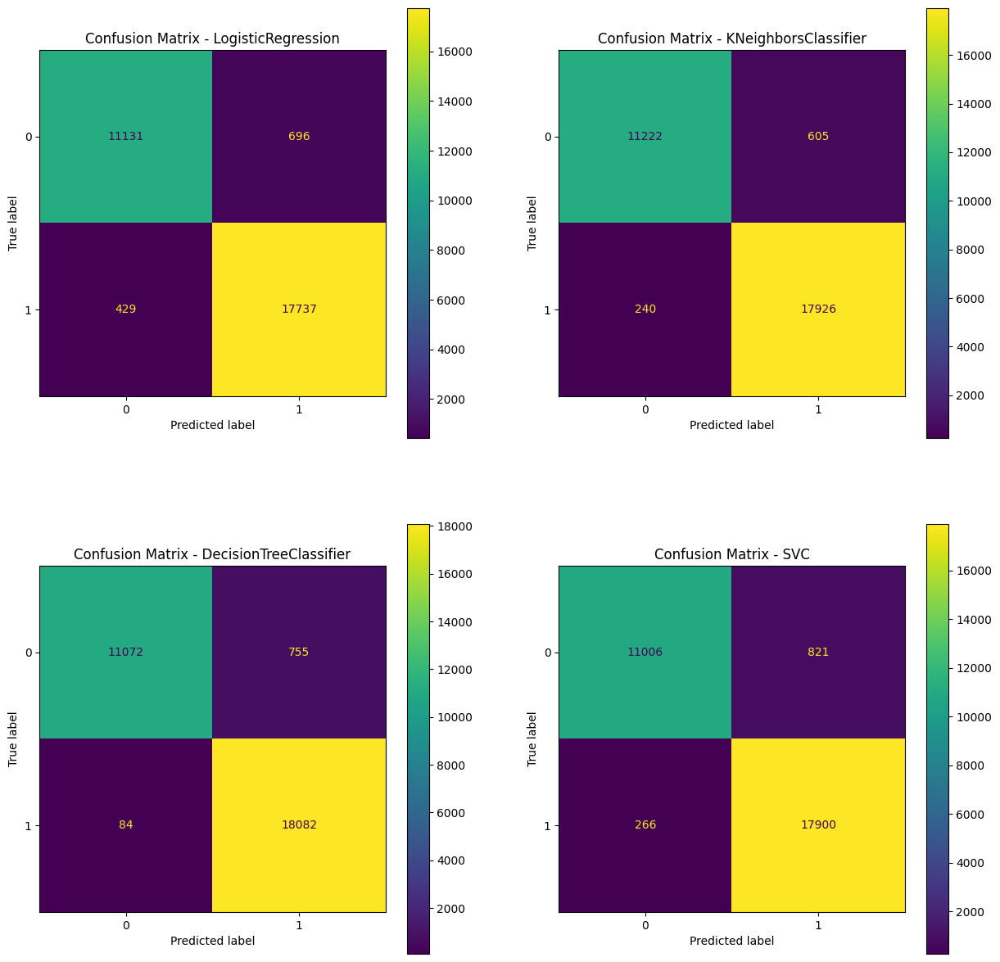

In [78]:
cmodels = [lr,knn, dt, svc]
plot_confusion_matrix_func('binary', cmodels, Xbin_test, ybin_test, 2, 2, 15, 15)

In [79]:
best_model_bin = dt

### Best model for binary classification confusion matrix with ROC plot

<Figure size 640x480 with 0 Axes>

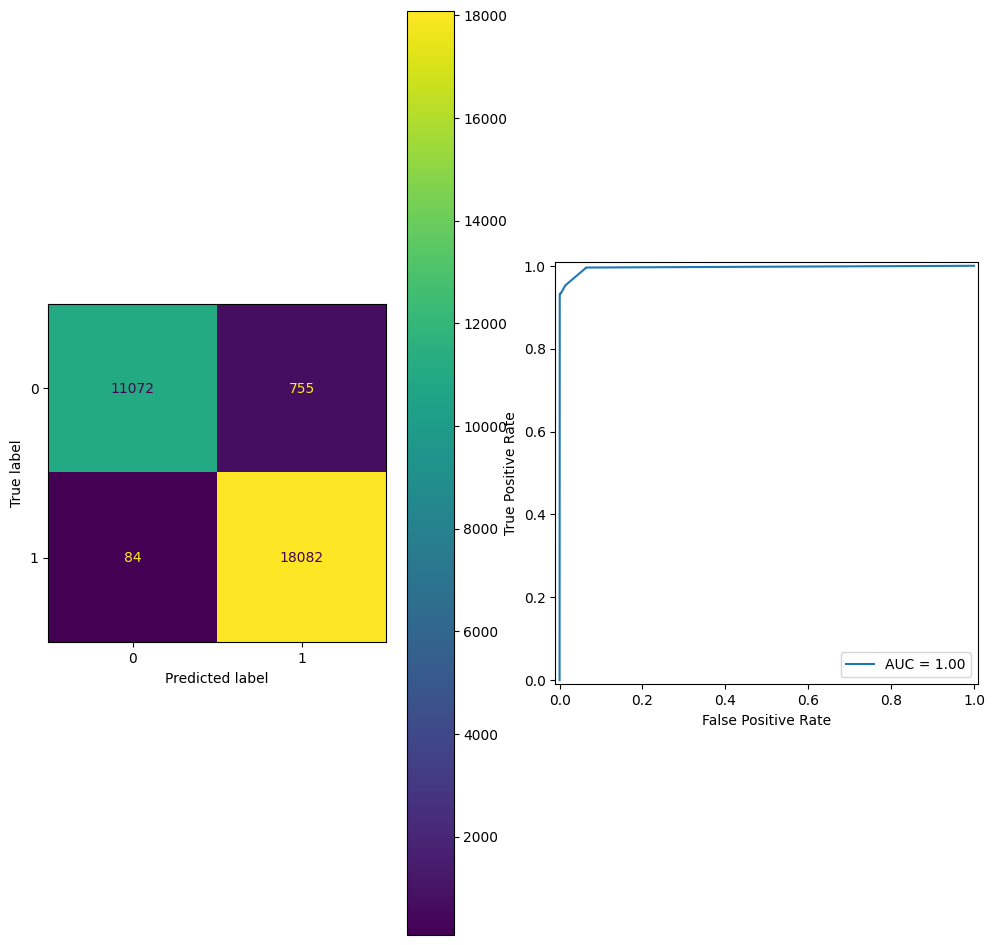

In [80]:
sns.reset_orig() 
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

# Confusion Matrix
cm = confusion_matrix(ybin_test, best_model_bin.predict(Xbin_test), labels = best_model_bin.classes_)
disp_cm = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = best_model_bin.classes_)
disp_cm.plot(ax=ax[0])

fpr, tpr, thresholds = roc_curve(ybin_test, best_model_bin.predict_proba(Xbin_test)[:, 1], pos_label=1)
disp_roc = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=skl_auc(fpr, tpr))
disp_roc.plot(ax=ax[1])

fp = cm[0][1]
fn = cm[1][0]
auc = round(skl_auc(fpr, tpr), 2)

plt.savefig('images/test_best_model_binary_confusion_matrix.png', bbox_inches='tight')
plt.show()

In [106]:
# Using binary best model, lets use it to get the top features that were selected. 
# Best on the result, features will be selected for further analysis before they are dropped.

results = permutation_importance(best_model_bin, Xbin_train, ybin_train, n_repeats=30, random_state=42)
important_features = results.importances_mean
sorted_idx = np.argsort(important_features)



<Figure size 640x480 with 0 Axes>

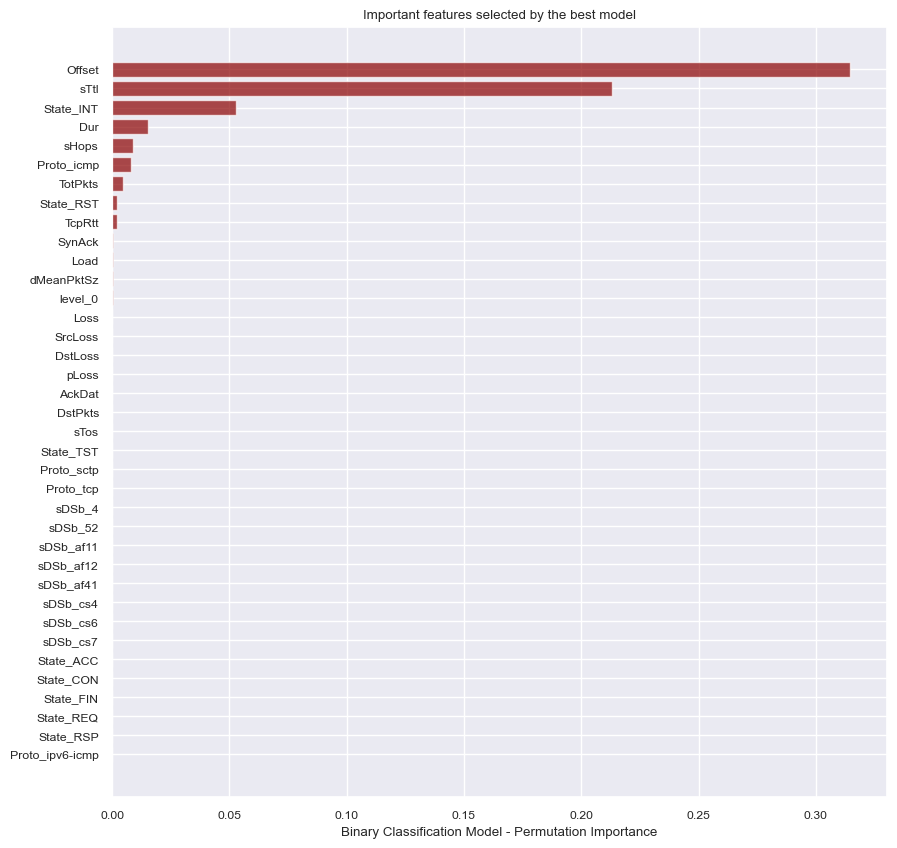

In [107]:
sns.set(style="darkgrid",font_scale=0.8)
fig, axs = plt.subplots(figsize=(10, 10))
plt.barh(range(len(sorted_idx)), important_features[sorted_idx], color='darkred', alpha=0.7)
plt.yticks(range(len(sorted_idx)), Xbin_test.columns[sorted_idx]);
plt.xlabel('Binary Classification Model - Permutation Importance')
plt.title('Important features selected by the best model')
plt.savefig('images/bin_permutation_importance.png', bbox_inches='tight')
plt.show()
plt.close()
plt.clf()

In [82]:
# Lets examine the top features selected by the best model



<Figure size 640x480 with 0 Axes>

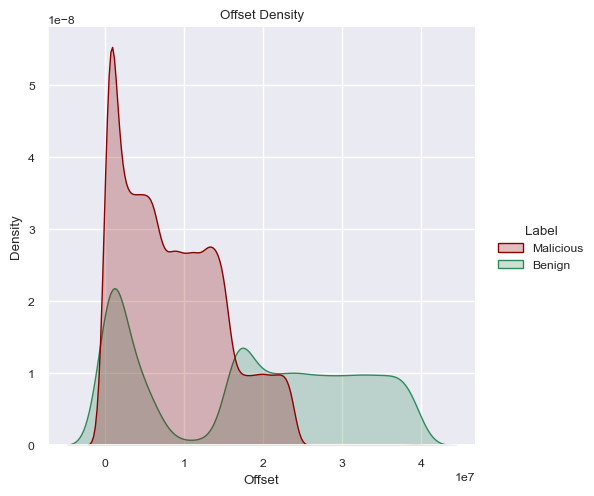

In [149]:
sns.displot(df, x="Offset", hue="Label", palette={'darkred', 'seagreen'}, kind="kde", fill=True)
plt.title('Offset Density')
plt.savefig('images/offset_density.png', bbox_inches='tight')
plt.show()
plt.close()
plt.clf()

<Figure size 640x480 with 0 Axes>

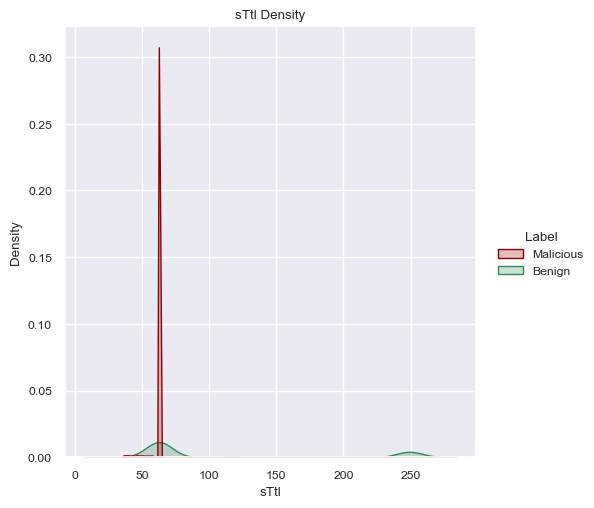

In [150]:
sns.displot(df, x="sTtl", hue="Label", palette={'darkred', 'seagreen'}, kind="kde", fill=True)
plt.title('sTtl Density')
plt.savefig('images/sttl_density.png', bbox_inches='tight')
plt.show()
plt.close()
plt.clf()

<Figure size 640x480 with 0 Axes>

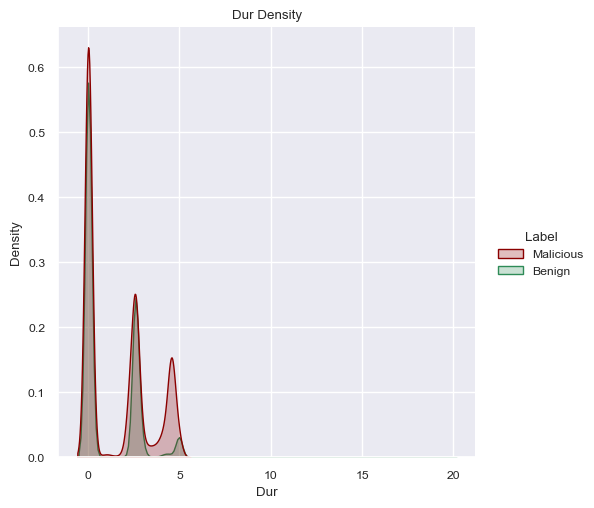

In [151]:
sns.displot(df, x="Dur", hue="Label", palette={'darkred', 'seagreen'}, kind="kde", fill=True)
plt.title('Dur Density')
plt.savefig('images/dur_density.png', bbox_inches='tight')
plt.show()
plt.close()
plt.clf()

<Figure size 640x480 with 0 Axes>

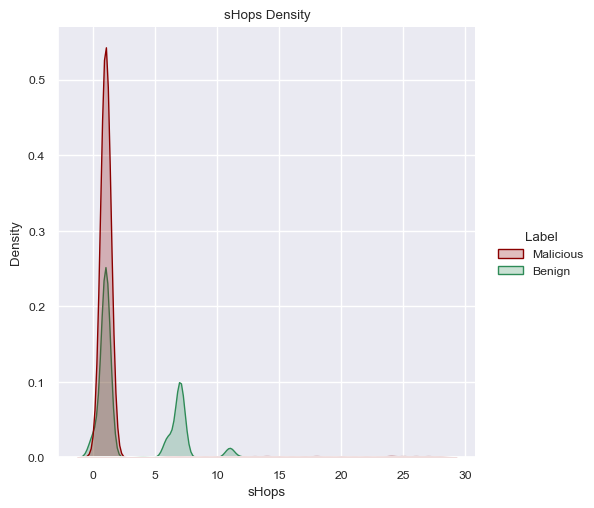

In [152]:
sns.displot(df, x="sHops", hue="Label", palette={'darkred', 'seagreen'}, kind="kde", fill=True)
plt.title('sHops Density')
plt.savefig('images/shops_density.png', bbox_inches='tight')
plt.show()
plt.close()
plt.clf()

### Determine melicious attack type - multi-class classification model performance

In [83]:
mc_res_dict, rmodels = grid_search(models, param_grids, Xmc_train, ymc_train, random_seed=42)


LR
Fitting 3 folds for each of 960 candidates, totalling 2880 fits


/Users/bashirhaswarey/Projects/AIML/AIML/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/Users/bashirhaswarey/Projects/AIML/AIML/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/Users/bashirhaswarey/Projects/AIML/AIML/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/Users/bashirhaswarey/Projects/AIML/A

{'algorithm': 'LR', 'params': {'C': 545.5594781168514, 'max_iter': 100, 'multi_class': 'multinomial', 'penalty': 'l2', 'solver': 'newton-cg'}, 'mean_score': 0.9601617549817411, 'std_score': 0.0002716585855926312, 'cv_result': {'mean_fit_time': array([6.39764468e-03, 6.37586912e-03, 5.07624944e-03, 4.92886519e+00,
       3.52157275e-01, 6.04293744e-01, 2.43792160e+00, 4.06963102e+00,
       5.70106506e-03, 5.89323044e-03, 6.47703807e-03, 6.40956561e-03,
       6.09397888e-03, 5.67936897e-03, 4.94647026e-03, 5.21155604e+00,
       3.58516455e-01, 5.91562430e-01, 2.32869021e+00, 5.60468920e+00,
       6.34598732e-03, 6.66340192e-03, 5.20730019e-03, 6.24394417e-03,
       5.42958577e-03, 5.23432096e-03, 6.12560908e-03, 5.32661279e+00,
       3.46731663e-01, 5.84594011e-01, 2.33194900e+00, 5.65833251e+00,
       5.38086891e-03, 6.22534752e-03, 5.36402067e-03, 5.37443161e-03,
       6.17504120e-03, 6.22765223e-03, 6.58432643e-03, 5.28100737e+00,
       3.66008043e-01, 6.65615479e-01, 2.32458

In [84]:
mc_results = pd.DataFrame(mc_res_dict)

In [85]:
mc_results

,algorithm,params,mean_score,std_score,cv_result
0,LR,"{'C': 545.5594781168514, 'max_iter': 100, 'mul...",0.960162,0.000272,"{'mean_fit_time': [0.006397644678751628, 0.006..."
1,KNN,"{'metric': 'manhattan', 'n_neighbors': 13, 'we...",0.968035,0.000519,"{'mean_fit_time': [0.007612864176432292, 0.010..."
2,DT,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.979481,0.001875,"{'mean_fit_time': [0.0443574587504069, 0.04441..."
3,SVC,"{'C': 1000, 'gamma': 1, 'kernel': 'rbf'}",0.975551,0.001145,"{'mean_fit_time': [1149.4403246243794, 76.0082..."


In [86]:
lrmc = rmodels[0]
lr_train_acc = lrmc.score(Xmc_train, ymc_train)
lr_test_acc = lrmc.score(Xmc_test, ymc_test)
print('The accuracy of the Logistic Regression model for training data is {:.2f}'.format(lr_train_acc))
print('The accuracy of the Logistic Regression model for test data is {:.2f}'.format(lr_test_acc))

The accuracy of the Logistic Regression model for training data is 0.96
The accuracy of the Logistic Regression model for test data is 0.94


In [87]:
knnmc = rmodels[1] 
knn_train_acc = knnmc.score(Xmc_train, ymc_train)
knn_test_acc = knnmc.score(Xmc_test, ymc_test)
print('The accuracy of the KNeighborsClassifier model for training data is  {:.2f}'.format(knn_train_acc))
print('The accuracy of the KNeighborsClassifier model for test data is {:.2f}'.format(knn_test_acc))

The accuracy of the KNeighborsClassifier model for training data is  1.00
The accuracy of the KNeighborsClassifier model for test data is 0.97


In [88]:
dtmc = rmodels[2]
dt_train_acc = dtmc.score(Xmc_train, ymc_train)
dt_test_acc = dtmc.score(Xmc_test, ymc_test)
print('The accuracy of the DecisionTreeClassifier model for training data is  {:.2f}'.format(dt_train_acc))
print('The accuracy of the DecisionTreeClassifier model for test data is {:.2f}'.format(dt_test_acc))

The accuracy of the DecisionTreeClassifier model for training data is  0.98
The accuracy of the DecisionTreeClassifier model for test data is 0.95


In [89]:
svcmc = rmodels[3]
svc_train_acc = svcmc.score(Xmc_train, ymc_train)
svc_test_acc = svcmc.score(Xmc_test, ymc_test)
print('The accuracy of the SVC model for training data is  {:.2f}'.format(svc_train_acc))
print('The accuracy of the SVC model for test data is {:.2f}'.format(svc_test_acc))

The accuracy of the SVC model for training data is  0.98
The accuracy of the SVC model for test data is 0.96


In [90]:
model_comparison_df = pd.DataFrame({ 'Model': ['Logistic Regression', 'KNN', 'Decision Tree', 'SVC'], \
                          'Train Accuracy':[lr_train_acc, knn_train_acc, dt_train_acc, svc_train_acc], \
                          'Test Accuracy':[lr_test_acc, knn_test_acc, dt_test_acc, svc_test_acc]})

print(model_comparison_df)

                 Model  Train Accuracy  Test Accuracy
0  Logistic Regression        0.960790       0.941620
1                  KNN        1.000000       0.968193
2        Decision Tree        0.981095       0.951255
3                  SVC        0.981353       0.963758



Model = LogisticRegression(C=545.5594781168514, multi_class='multinomial',
                   solver='newton-cg') AUC = 1.0

Model = KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance') AUC = 1.0

Model = DecisionTreeClassifier(max_depth=10, min_samples_leaf=5) AUC = 1.0

Model = SVC(C=1000, gamma=1, probability=True) AUC = 1.0


<Figure size 640x480 with 0 Axes>

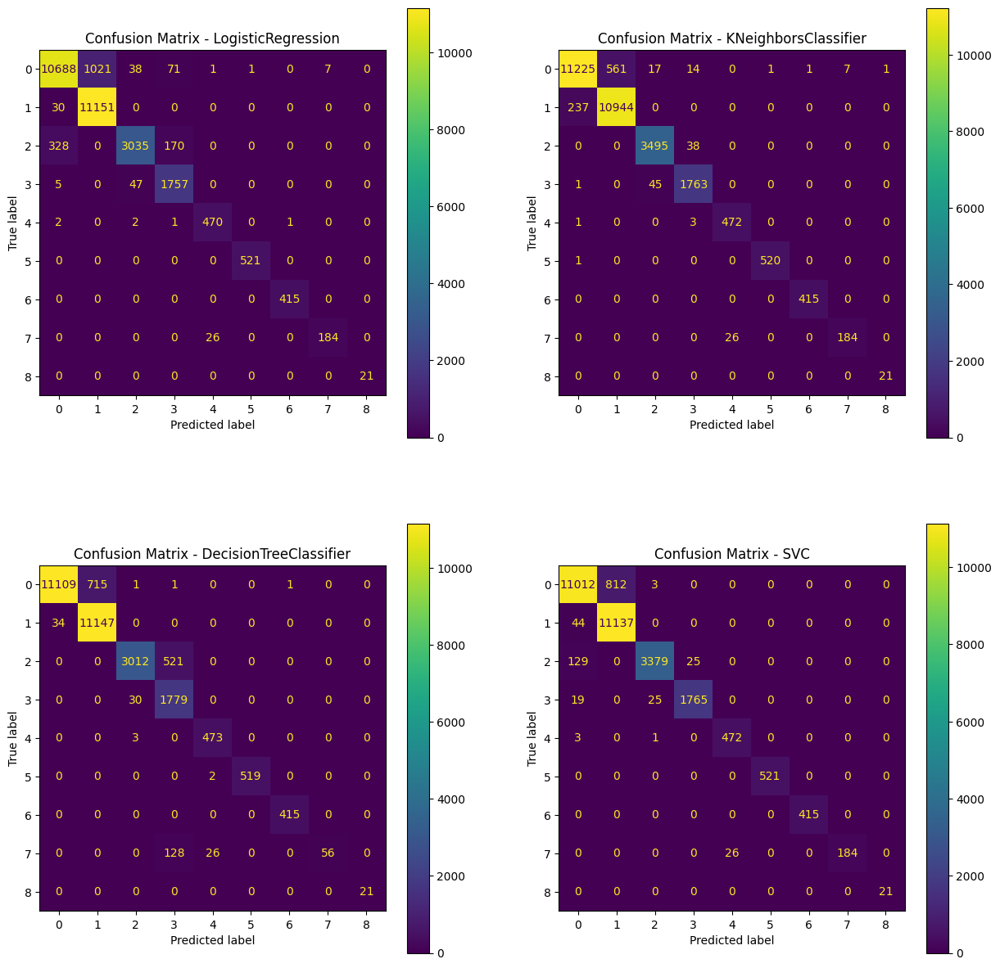

In [91]:
cmodels = [lrmc,knnmc, dtmc, svcmc]
plot_confusion_matrix_func('multi-class', cmodels, Xmc_test, ymc_test, 2, 2, 15, 15)

In [92]:
best_model_mc = knnmc

### Best model for multi-class classification confusion matrix with ROC plot

<Figure size 640x480 with 0 Axes>

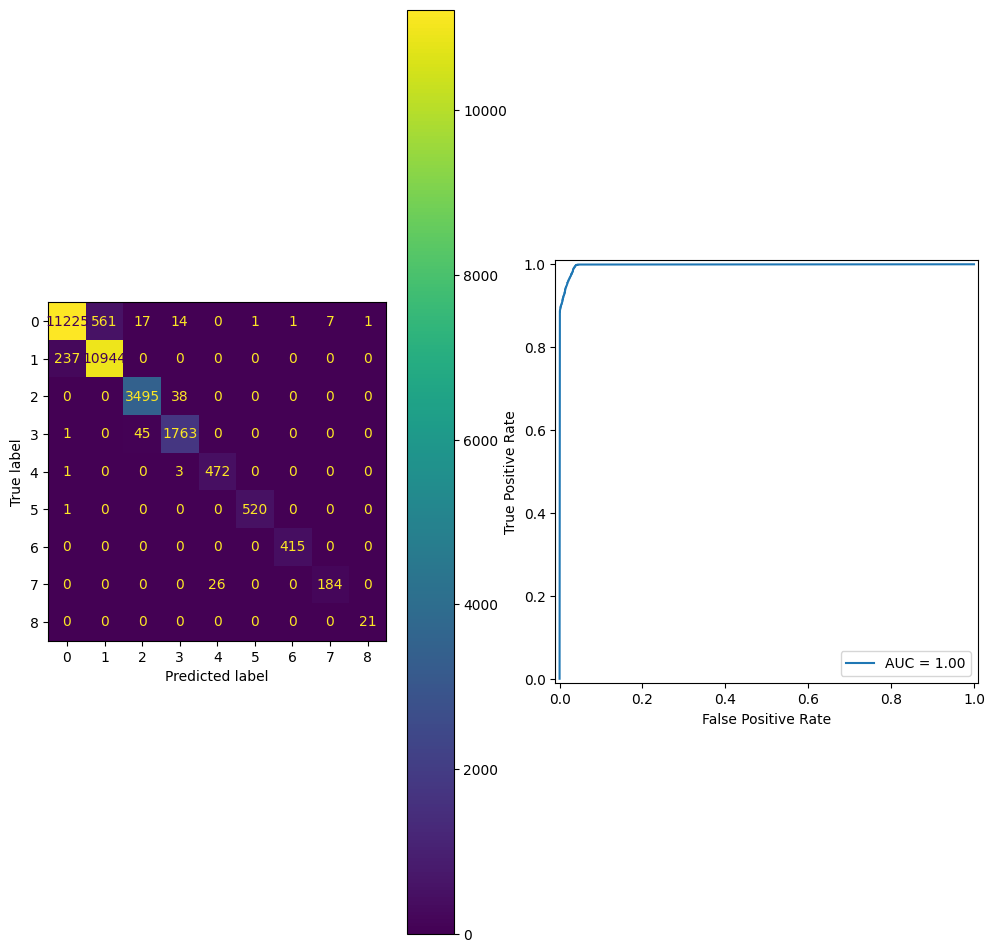

In [93]:
sns.reset_orig() 
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

# Confusion Matrix
cm = confusion_matrix(ymc_test, best_model_mc.predict(Xmc_test), labels = best_model_mc.classes_)
disp_cm = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = best_model_mc.classes_)
disp_cm.plot(ax=ax[0])

fpr, tpr, thresholds = roc_curve(ymc_test, best_model_mc.predict_proba(Xmc_test)[:, 1], pos_label=1)
disp_roc = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=skl_auc(fpr, tpr))
disp_roc.plot(ax=ax[1])

fp = cm[0][1]
fn = cm[1][0]
auc = round(skl_auc(fpr, tpr), 2)

plt.savefig('images/test_best_model_multi-class_confusion_matrix.png', bbox_inches='tight')
plt.show()

### Training

In [94]:
models

{'LR': LogisticRegression(),
 'KNN': KNeighborsClassifier(),
 'DT': DecisionTreeClassifier(),
 'SVC': SVC(probability=True)}

In [95]:
def train_all(res_tab, Xtrain, Ytrain, model_list=None):
    if model_list is None:
        model_list = res_tab['algorithm'].unique()
    table = res_tab[res_tab['algorithm'].isin(model_list)].set_index('algorithm')
    result = {}
    for model_name in model_list:
        model = copy.deepcopy(models[model_name])
        model.set_params(**table.loc[model_name, 'params'])
        model.fit(Xtrain, Ytrain)
        result[model_name] = model
    return result 

In [96]:
bin_models = train_all(bin_results, Xbin_train, ybin_train)

In [97]:
mc_models = train_all(mc_results, Xmc_train, ymc_train)

### Evaluating models

In [98]:
def eval_all(models, Xtest, Ytest, model_list=None, **kwargs):
    if model_list is None:
        model_list = list(models.keys())
    for key, model in models.items():
        print(key)
        y_pred = model.predict(Xtest)
        print(classification_report(Ytest, y_pred, **kwargs))

### Binary

In [99]:
eval_all(bin_models, Xbin_test, ybin_test, target_names={'Benign', 'Malicious'})

LR
              precision    recall  f1-score   support

   Malicious       0.96      0.94      0.95     11827
      Benign       0.96      0.98      0.97     18166

    accuracy                           0.96     29993
   macro avg       0.96      0.96      0.96     29993
weighted avg       0.96      0.96      0.96     29993

KNN
              precision    recall  f1-score   support

   Malicious       0.98      0.95      0.96     11827
      Benign       0.97      0.99      0.98     18166

    accuracy                           0.97     29993
   macro avg       0.97      0.97      0.97     29993
weighted avg       0.97      0.97      0.97     29993

DT
              precision    recall  f1-score   support

   Malicious       0.99      0.94      0.96     11827
      Benign       0.96      1.00      0.98     18166

    accuracy                           0.97     29993
   macro avg       0.98      0.97      0.97     29993
weighted avg       0.97      0.97      0.97     29993

SVC
     

### Multi-class

In [100]:
eval_all(mc_models, Xmc_test, ymc_test, target_names={'Benign', 'UDPFlood', 'HTTPFlood', 'SlowrateDoS', \
                                                      'TCPConnectScan', 'SYNScan', 'UDPScan', 'SYNFlood', 'ICMPFlood'})

LR
                precision    recall  f1-score   support

        Benign       0.97      0.90      0.93     11827
TCPConnectScan       0.92      1.00      0.95     11181
       SYNScan       0.97      0.86      0.91      3533
     HTTPFlood       0.88      0.97      0.92      1809
       UDPScan       0.95      0.99      0.97       476
     ICMPFlood       1.00      1.00      1.00       521
      UDPFlood       1.00      1.00      1.00       415
      SYNFlood       0.96      0.88      0.92       210
   SlowrateDoS       1.00      1.00      1.00        21

      accuracy                           0.94     29993
     macro avg       0.96      0.95      0.96     29993
  weighted avg       0.94      0.94      0.94     29993

KNN
                precision    recall  f1-score   support

        Benign       0.98      0.95      0.96     11827
TCPConnectScan       0.95      0.98      0.96     11181
       SYNScan       0.98      0.99      0.99      3533
     HTTPFlood       0.97      0.97  

In [101]:
# Different Score View - Multi-class
labels = np.array(['Benign', 'UDPFlood', 'HTTPFlood', 'SlowrateDoS', 'TCPConnectScan', 'SYNScan', 'UDPScan', 'SYNFlood', 'ICMPFlood'])
model_list_mc = [lrmc, knnmc, dtmc]
model_comparison_mc = []
model_name_list_mc = []
for model_mc in model_list_mc:
    ymc_pred = model_mc.predict(Xmc_test)
    precision, recall, fscore, support = score(ymc_test, ymc_pred)
    model_name_list_mc.append(type(model_mc).__name__)
    model_comparison_mc.append(pd.DataFrame({ 'Classes': labels, \
                          'precision':precision, \
                          'recall':recall, \
                          'f1-score':fscore, \
                          'support':support}))

for item, mod_name in zip(model_comparison_mc, model_name_list_mc):
    print("\n\n")
    display("Model: " + mod_name)
    display(item)

'Model: LogisticRegression'

,Classes,precision,recall,f1-score,support
0,Benign,0.966977,0.903695,0.934266,11827
1,UDPFlood,0.916119,0.997317,0.954995,11181
2,HTTPFlood,0.972133,0.859043,0.912096,3533
3,SlowrateDoS,0.878939,0.971255,0.922794,1809
4,TCPConnectScan,0.945674,0.987395,0.966084,476
5,SYNScan,0.998084,1.000000,0.999041,521
6,UDPScan,0.997596,1.000000,0.998797,415
7,SYNFlood,0.963351,0.876190,0.917706,210
8,ICMPFlood,1.000000,1.000000,1.000000,21


'Model: KNeighborsClassifier'

,Classes,precision,recall,f1-score,support
0,Benign,0.979067,0.949100,0.963850,11827
1,UDPFlood,0.951239,0.978803,0.964824,11181
2,HTTPFlood,0.982570,0.989244,0.985896,3533
3,SlowrateDoS,0.969747,0.974572,0.972153,1809
4,TCPConnectScan,0.947791,0.991597,0.969199,476
5,SYNScan,0.998081,0.998081,0.998081,521
6,UDPScan,0.997596,1.000000,0.998797,415
7,SYNFlood,0.963351,0.876190,0.917706,210
8,ICMPFlood,0.954545,1.000000,0.976744,21


'Model: DecisionTreeClassifier'

,Classes,precision,recall,f1-score,support
0,Benign,0.996949,0.939291,0.967262,11827
1,UDPFlood,0.939723,0.996959,0.967496,11181
2,HTTPFlood,0.988838,0.852533,0.915641,3533
3,SlowrateDoS,0.732400,0.983416,0.839547,1809
4,TCPConnectScan,0.944112,0.993697,0.968270,476
5,SYNScan,1.000000,0.996161,0.998077,521
6,UDPScan,0.997596,1.000000,0.998797,415
7,SYNFlood,1.000000,0.266667,0.421053,210
8,ICMPFlood,1.000000,1.000000,1.000000,21


In [102]:
from itertools import combinations
from sklearn.preprocessing import LabelBinarizer

def plot_one_on_one_auc(model, X_te, y_te):
    sns.reset_orig() 
    plt.close()
    label_binarizer = LabelBinarizer().fit(y_te)
    pair_list = list(combinations(np.unique(ymc), 2))
    pair_scores = []
    target_names = np.array(['Benign', 'UDPFlood', 'HTTPFlood', 'SlowrateDoS', 'TCPConnectScan', 'SYNScan', 'UDPScan', 'SYNFlood', 'ICMPFlood'])
    mean_tpr = dict
    #y_score = lr.fit(X_tr, y_tr).predict_proba(X_te)
    fpr, tpr, thresholds = roc_curve(y_te, model.predict_proba(X_te)[:, 1], pos_label=1)
    y_score = model.predict_proba(X_te)
    fig, ax = plt.subplots(9, 4, figsize=(25, 80))
    plt.figure().clear()
    i = 0
    j = 0
    for ix, (label_a, label_b) in enumerate(pair_list):
        a_mask = y_te == label_a
        b_mask = y_te == label_b
        ab_mask = np.logical_or(a_mask, b_mask)
        
        fpr_grid = fpr
        a_true = a_mask[ab_mask]
        b_true = b_mask[ab_mask]

        idx_a = np.flatnonzero(label_binarizer.classes_ == label_a)[0]
        idx_b = np.flatnonzero(label_binarizer.classes_ == label_b)[0]

        fpr_a, tpr_a, _ = roc_curve(a_true, y_score[ab_mask, idx_a])
        fpr_b, tpr_b, _ = roc_curve(b_true, y_score[ab_mask, idx_b])

        mean_tpr[ix] = np.zeros_like(fpr_grid)
        mean_tpr[ix] += np.interp(fpr_grid, fpr_a, tpr_a)
        mean_tpr[ix] += np.interp(fpr_grid, fpr_b, tpr_b)
        mean_tpr[ix] /= 2
        mean_score = metrics.auc(fpr_grid, mean_tpr[ix])
        pair_scores.append(mean_score)

        #fig, ax = plt.subplots(figsize=(6, 6))
        plt.plot(
            fpr_grid,
            mean_tpr[ix],
            #label=f"Mean {label_a} vs {label_b} (AUC = {mean_score :.2f})",
            linestyle=":",
            linewidth=4,
         
        )
    
        
        RocCurveDisplay.from_predictions(
            a_true,
            y_score[ab_mask, idx_a],
            ax=ax[i,j],
            name=f"{target_names[int(label_a)]} as positive class",
        )

        RocCurveDisplay.from_predictions(
            b_true,
            y_score[ab_mask, idx_b],
            ax=ax[i,j],
            name=f"{target_names[int(label_b)]} as positive class",
            plot_chance_level=True,
        )
        ax[i,j].set(
            xlabel="False Positive Rate",
            ylabel="True Positive Rate",
            title=f"{target_names[idx_a]} vs {target_names[int(label_b)]} ROC curves",
        )
        if j == 3:
            j = 0
            i = i + 1
        else:
            j = j + 1

    print(f"Macro-averaged One-vs-One ROC AUC score:\n{np.average(pair_scores):.2f}")
    plt.savefig('images/test_best_model_multi-class_one_vs_one_matrix.png', bbox_inches='tight')
    plt.show()
    plt.close()
    plt.clf()

Macro-averaged One-vs-One ROC AUC score:
0.99


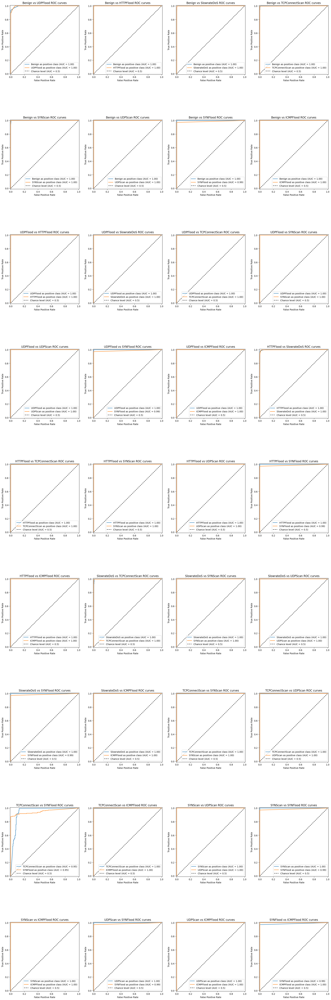

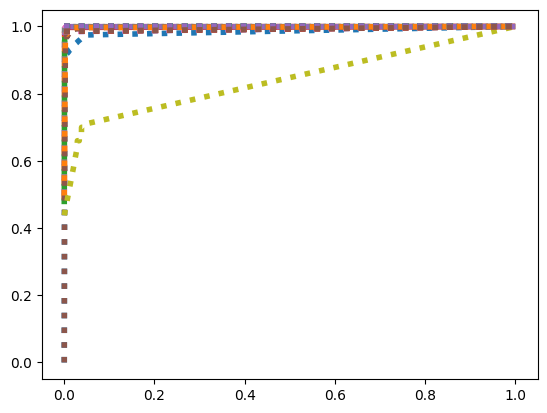

In [103]:

plot_one_on_one_auc(best_model_mc, Xmc_test, ymc_test)

<Figure size 640x480 with 0 Axes>

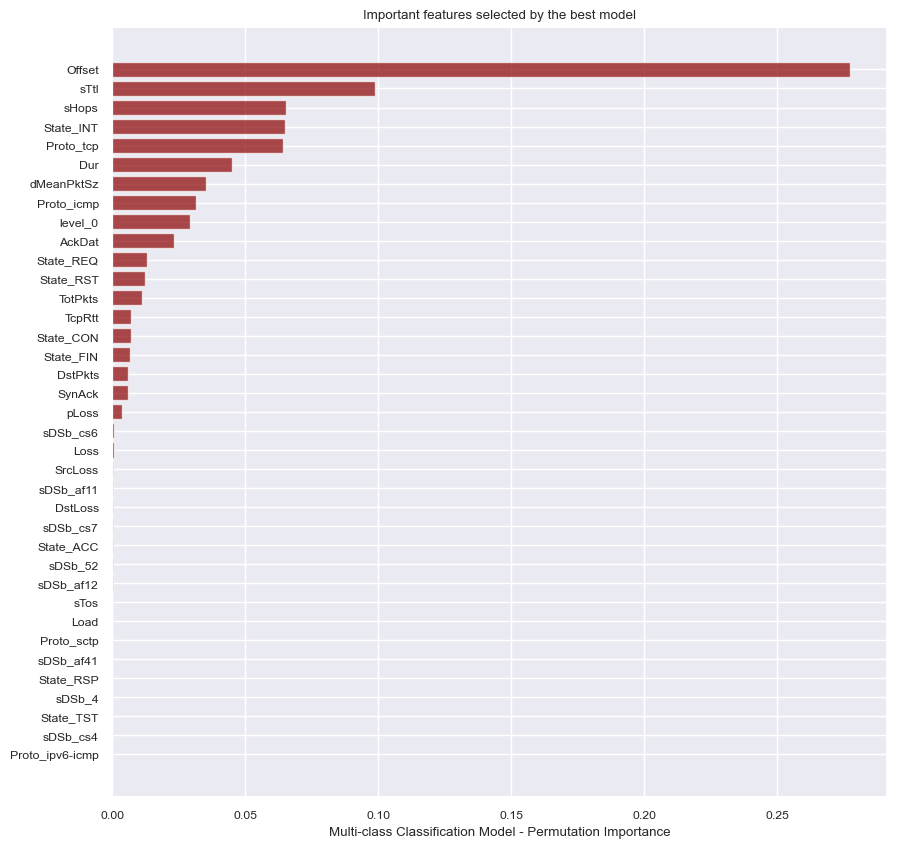

In [104]:
# Using multi-class best model, lets use it to get the top features that were selected. 
# Best on the result, features will be selected for further analysis before they are dropped.

results = permutation_importance(best_model_mc, Xmc_train, ymc_train, n_repeats=30, random_state=42)
important_features = results.importances_mean
sorted_idx = np.argsort(important_features)

sns.set(style="darkgrid",font_scale=0.8)
fig, axs = plt.subplots(figsize=(10, 10))
plt.barh(range(len(sorted_idx)), important_features[sorted_idx], color='darkred', alpha=0.7)
plt.yticks(range(len(sorted_idx)), Xmc_test.columns[sorted_idx]);
plt.xlabel('Multi-class Classification Model - Permutation Importance')
plt.title('Important features selected by the best model')
plt.savefig('images/multi-class_permutation_importance.png', bbox_inches='tight')
plt.show()
plt.close()
plt.clf()

<Figure size 640x480 with 0 Axes>

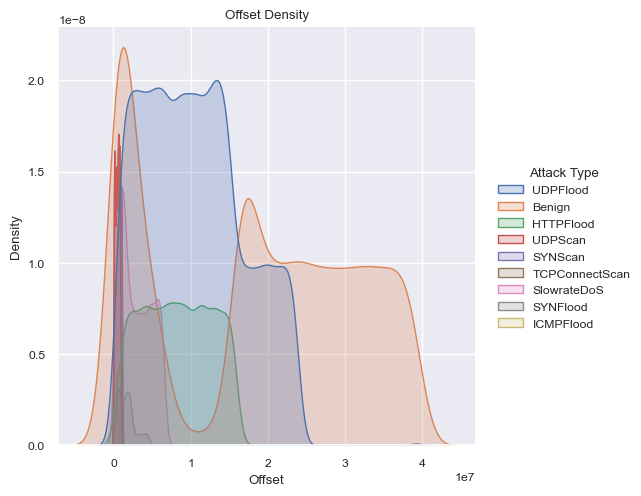

In [147]:
sns.displot(df, x="Offset", hue="Attack Type", kind="kde", fill=True)
plt.title('Offset Density')
plt.savefig('images/mc_offset_density.png', bbox_inches='tight')
plt.show()
plt.close()
plt.clf()

<Figure size 640x480 with 0 Axes>

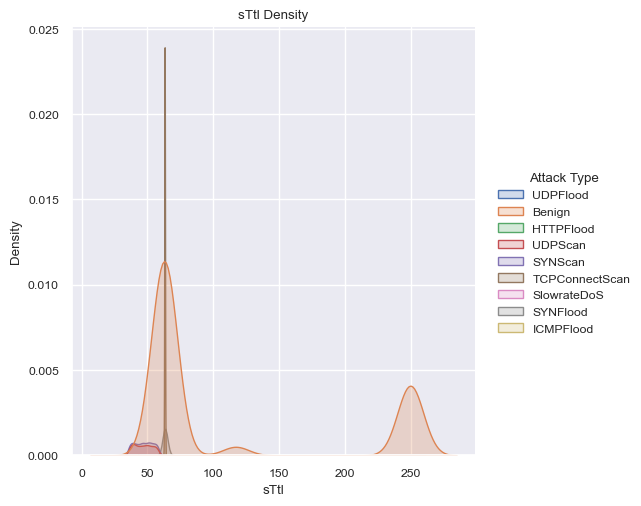

In [148]:
sns.displot(df, x="sTtl", hue="Attack Type", kind="kde", fill=True)
plt.title('sTtl Density')
plt.savefig('images/mc_sttl_density.png', bbox_inches='tight')
plt.show()
plt.close()
plt.clf()

<Figure size 640x480 with 0 Axes>

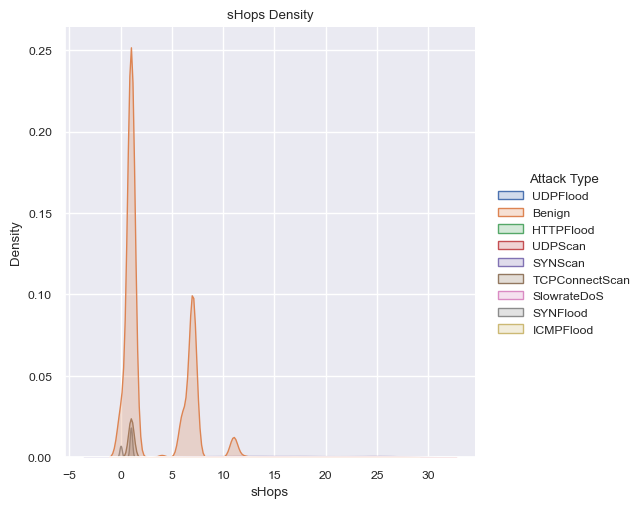

In [157]:
sns.displot(df, x="sHops", hue="Attack Type", kind="kde", fill=True)
plt.title('sHops Density')
plt.savefig('images/mc_shops_density.png', bbox_inches='tight')
plt.show()
plt.close()
plt.clf()

#### Conclusion
* For binary classification, target feature is balanced
* For multi-class classification, target feature is imbalanced. Therefore, examined F1-score.
* All of the models performed weel. The best model for binary classification is DT while the best model for multi-class classification is KNN.
* DT and KNN performance was very close, therefore for deployment, KNN will be used to predict 'Label' at level 1 and 'Attack Type' at level 2.
  